In [ ]:
import ast
import datetime
import json
import re
import string
import time
import warnings
from collections import Counter
from ast import literal_eval

import matplotlib.pyplot as plt
import nltk
import numpy as np
import optuna
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from PIL import Image
from lightgbm import LGBMClassifier
from mpl_toolkits.mplot3d import Axes3D
from nltk.corpus import stopwords
from plotly.subplots import make_subplots
from scipy import stats
from scipy.stats import chi2_contingency, f_oneway
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.exceptions import ConvergenceWarning
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    StratifiedKFold,
    cross_val_score,
    train_test_split,
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    LabelEncoder,
    MultiLabelBinarizer,
    OneHotEncoder,
    StandardScaler,
)
from textblob import TextBlob
from wordcloud import WordCloud
from xgboost import XGBClassifier
from mlxtend.frequent_patterns import apriori
from mlxtend.preprocessing import TransactionEncoder
from sklearn.multioutput import MultiOutputClassifier

In [2]:
data = pd.read_csv('image_database.csv')
data['date'] = pd.to_datetime(data['date'])
data.head()

,folder,date,path,caption,faces_label,total_faces,objects_label,total_objects,text,cluster_id,background_class,color_palette,feature
0,myPhoto,2024-11-25,D:\image_search_engine_ai-end\sources\photos\c...,a photography of a cake with a lit candle on t...,NaN,0,cake,[1],NaN,78,"candle, taper, wax light","[[147, 122, 75], [236, 230, 225], [51, 91, 82]...","[0.425487756729126, 0.0, 7.621761322021484, 16..."
1,myPhoto,2024-11-25,D:\image_search_engine_ai-end\sources\photos\c...,a photography of a birthday cake with candles ...,NaN,0,"cake,dining table","[2, 1]",NaN,78,"candle, taper, wax light","[[200, 53, 103], [98, 151, 187], [63, 124, 165...","[0.0, 0.9258819818496704, 1.8235361576080322, ..."
2,myPhoto,2024-11-25,D:\image_search_engine_ai-end\sources\photos\c...,a photography of a slice of cake with a sparkl...,NaN,0,"fork,dining table,cake","[1, 2, 1]",NaN,78,matchstick,"[[185, 129, 75], [152, 67, 50], [36, 67, 67], ...","[0.8089744448661804, 1.863817811012268, 4.5758..."
3,myPhoto,2024-11-25,D:\image_search_engine_ai-end\sources\photos\c...,a photography of a slice of cake with a lit ca...,NaN,0,"dining table,fork,person,cake","[1, 1, 1, 2]",NaN,78,"candle, taper, wax light","[[222, 211, 209], [124, 83, 84], [127, 161, 15...","[0.0, 1.0914195775985718, 16.860008239746094, ..."
4,myPhoto,2024-11-25,D:\image_search_engine_ai-end\sources\photos\c...,a photography of a slice of cake with a sparkl...,NaN,0,"bowl,fork,cake,dining table","[2, 1, 2, 1]",NaN,78,"bakery, bakeshop, bakehouse","[[177, 119, 60], [193, 150, 115], [69, 57, 52]...","[0.0, 3.0645499229431152, 19.31719970703125, 3..."


In [3]:
info_data = pd.DataFrame({
    'data_type': data.dtypes,
    'missing values': data.isnull().sum(),
    'unique values': data.nunique(),
    'duplicated values': data.duplicated().sum()
})

print(f'data shape: {data.shape}')
print(f'data details:')
info_data

data shape: (6140, 13)
data details:


,data_type,missing values,unique values,duplicated values
folder,object,0,4,0
date,datetime64[ns],0,366,0
path,object,0,6140,0
caption,object,11,5091,0
faces_label,object,5545,88,0
total_faces,int64,0,14,0
objects_label,object,1261,1906,0
total_objects,object,0,1217,0
text,object,3898,1915,0
cluster_id,int64,0,101,0


## Explore missing values and Impute

faces_label         90.309446
text                63.485342
objects_label       20.537459
background_class     7.214984
caption              0.179153
feature              0.162866
dtype: float64


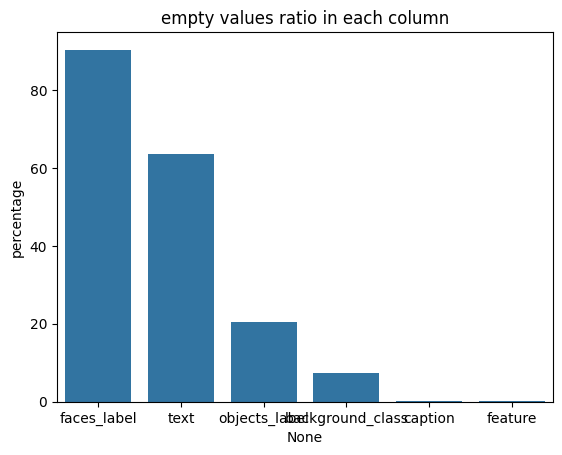

In [4]:
missing_percentage = (data.isnull().sum() / len(data)) * 100
missing_percentage = missing_percentage[missing_percentage > 0].sort_values(ascending=False)

print(missing_percentage)

sns.barplot(x=missing_percentage.index, y=missing_percentage.values)
plt.title("empty values ratio in each column")
plt.ylabel("percentage")
plt.show()

the `faces_label` feature has the most missing percentage, hence meaning there it almost 30% of the images have photog of persons, but we are going to investigate further, in case there are values gone missing by mistake

for the `text` feature, we can say that  about 30% from the images it is a photo for a document

but for the `objects_label` feature, we will try to impute it depending on the rest of the features in the data

and we can simply drop the `caption` and `feature` missing value row, because it is only one value

In [5]:
data['text'] = data['text'].fillna('no_text')
data = data.dropna(subset=['caption', 'feature'])

In [6]:
mistaken_empty_faces_label = data[(data['faces_label'].isna()) & (data['total_faces'] >= 1)]

print(f"Found {len(mistaken_empty_faces_label)} rows with missing persons but faces >= 1:")

Found 207 rows with missing persons but faces >= 1:


then there are indeed values gone missing by mistake, we are goring to impute it with the most common `persons` value

In [7]:

total_persons = [person.strip() for persons_list in data['faces_label'].dropna() for person in str(persons_list).split(",")]
total_persons = pd.DataFrame(Counter(total_persons).most_common(), columns=['Person', 'Count'])

fig = px.bar(total_persons, 
             x='Count', 
             y='Person',
             orientation='h',
             color='Count',
             color_continuous_scale='Viridis')

fig.update_layout(yaxis={'categoryorder':'total ascending'},
                 height=600,
                 xaxis_title="total appearance",
                 yaxis_title="person name")
fig.show()

In [8]:
data[data['faces_label'].isnull()]['total_faces'].unique()

array([0, 1, 2], dtype=int64)

we can see that the missing person name happen to correlate with having one face (*`1` as a value for `total_faces`*) or no face at all (*`0` as a value for `total_faces`*)

In [9]:
mask = data['faces_label'].isnull() & (data['total_faces'] == 1)
data.loc[mask, 'faces_label'] = 'robin'

data['faces_label'] = data['faces_label'].fillna('no_person')

we fill the empty cells in the `persons` column with the most frequent person name, which is `robin`, if and only if the `total_faces` is equal to `1`, and the rest of the missing values with `no_person`

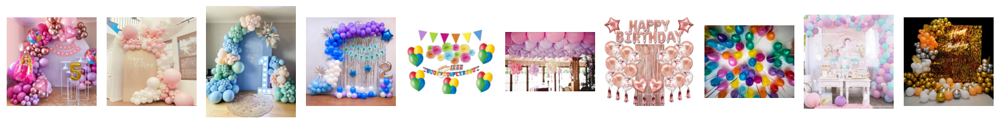

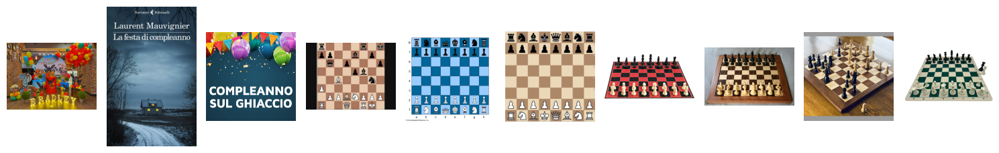

In [12]:
missing_objects = data[data["objects_label"].isnull()].head(20)

plt.figure(figsize=(15, 10))

for i, (idx, row) in enumerate(missing_objects.iterrows(), 1):
    col_num = i
    if i == 11:
        plt.tight_layout()
        plt.show()
        plt.figure(figsize=(15, 10))
    if i >= 11: col_num = i - 10

    plt.subplot(1, 10, col_num)
    plt.imshow(Image.open(row['path']))    
    plt.axis('off')
    
plt.tight_layout()
plt.show()

we can conclude from the first 20 images that have missing values in the `objects_label` column, indicates there is no objects to detect, meaning it didn't gone missing by mistake

then we are going to fill the missingness with `no_objects`

In [ ]:
data['objects_label'] = data['objects_label'].fillna('no_objects')

## EDA

### `folder` analysis

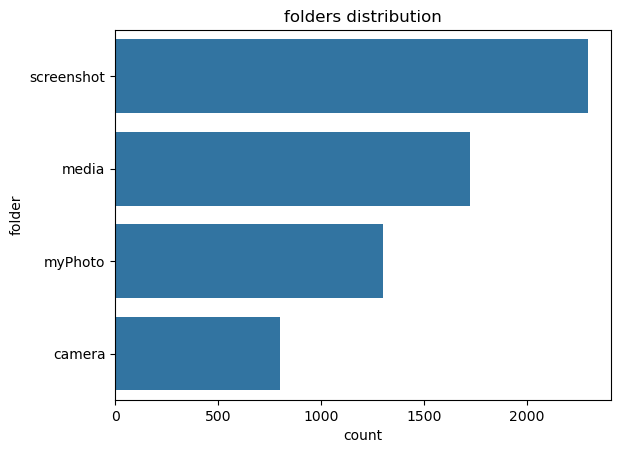

In [15]:
sns.countplot(data=data, y='folder', order=data['folder'].value_counts().index)
plt.title('folders distribution')
plt.show()

form the folders' images capacity, the user doesn't care about taking personal photos by the phone camera, and rather store images driven from media or friend and the other communities

### `caption` and `text` analysis

In [16]:
def clean_and_analyze_text(text_series, title):
    all_text = ' '.join(text_series.dropna().astype(str))
    
    words = all_text.split()
    english_stopwords = set(stopwords.words('english'))
    words = [word for word in words if word.lower() not in english_stopwords and len(word) > 2]
    word_freq = Counter(words)
    
    # most common words (excluding the first which is often a stopword that slipped through)
    common_words = word_freq.most_common(50)[1:]
    
    fig = make_subplots(rows=1, cols=2, 
                       subplot_titles=(f'Most Common Words in {title}', 
                                     f'Word Cloud for {title}'),
                       column_widths=[0.5, 0.5])
    
    fig.add_trace(
        go.Bar(
            x=[count for _, count in common_words],
            y=[word for word, _ in common_words],
            orientation='h',
            marker_color='skyblue'
        ),
        row=1, col=1
    )
    
    wordcloud = WordCloud(width=800, height=400,
                         background_color='white',
                         font_path='arial').generate(all_text)
    
    # fig.add_layout_image(
    #     dict(
    #         source=wordcloud.to_image(),
    #         xref="x2",
    #         yref="y2",
    #         x=0,
    #         y=1,
    #         sizex=1,
    #         sizey=1,
    #         xanchor="left",
    #         yanchor="top",
    #         sizing="stretch"
    #     ),
    #     row=1, col=2
    # )
    
    # fig.update_layout(
    #     title_text=f"Text Analysis for {title}",
    #     height=600,
    #     width = 1500,
    #     showlegend=False,
    #     xaxis2={'visible': False},
    #     yaxis2={'visible': False},
    #     yaxis={'autorange': "reversed"},
    #     margin=dict(t=100)
    # )
    
    # fig.show()

clean_and_analyze_text(data['caption'], 'caption')
clean_and_analyze_text(data['text'], 'text')

![](analysis%20for%20caption.png)
![](analysis%20for%20text.png)

clearly from the word cloud for both of the `text` and `caption`, we can see that:
1. repetitive `women` word meaning most images are for a female, and the dominant name in `persons` column is `robin` => so the gallery for a women named `robin`
2. we can see she is interested in chess, drawing, also have lots of images in dresses or for dresses, and like reading (specifically for Ken Foullte author, science fiction, art, chess, AI topics), New York Times news, and meals recipes 
4. as a career, she has lots of images for python and coding tips maybe, and seems to care about a some kind of class related to her hobbies, and university ads, lots of laptop photog
5. as food preference, seems to be mostly related to salad, vegetables, and healthy style routine
6. also there are photos for bails, grocery shop bail and other fees type

### `background_class` depending on `persons`

In [17]:
clean_and_analyze_text(data[data['faces_label'] != 'no_person']['background_class'], 'background')

![](analysis%20for%20faces%20label%20-%20background%20class.png)

the gallery owner, usually care to take photos in her house or restaurant, clothing retails store, tobacco store, libraries, and internet or tech related booth

### `color_palette` distribution for the `camera` folder

In [ ]:
camera_palettes = data[data['folder'] == 'camera']['color_palette'].apply(ast.literal_eval)

all_colors = [color for palette in camera_palettes for color in palette]

brightness = [0.2126*r + 0.7152*g + 0.0722*b for r,g,b in all_colors]

color_df = pd.DataFrame(all_colors, columns=['R', 'G', 'B'])
color_df['Brightness'] = brightness

print("Brightness Statistics:")
print(color_df['Brightness'].describe())

# 3D Visualization
# fig = plt.figure(figsize=(12, 8))
# ax = fig.add_subplot(111, projection='3d')

# for idx, row in color_df.iterrows():
#     normalized_color = np.array([[row['R']/255, row['G']/255, row['B']/255]])
#     ax.scatter(row['R'], row['G'], row['B'], 
#                c=normalized_color, 
#                s=50, alpha=0.7)

# ax.set_xlabel('Red')
# ax.set_ylabel('Green')
# ax.set_zlabel('Blue')
# ax.set_title('Color Palette in RGB Space (Camera Folder)')

# plt.figure(figsize=(10, 5))
# plt.hist(color_df['Brightness'], bins=20, color='skyblue', edgecolor='black')
# plt.title('Distribution of Color Brightness')
# plt.xlabel('Brightness Value (0-255)')
# plt.ylabel('Frequency')

# plt.tight_layout()
# plt.show()

# print("\nSample Colors with Brightness:")
# print(color_df.head(10))

Brightness Statistics:
count    23258.000000
mean        95.767941
std         65.977532
min          4.000000
25%         37.706400
50%         85.322800
75%        145.142800
max        254.572000
Name: Brightness, dtype: float64


![color palette for camera](color_palette_camera.png)

we can conclude that most of the gallery owner images have been taken in low light conditions, meaning in evening, then we can say the user becomes active during evening

### image pixels features

In [19]:
data['feature'] = data['feature'].apply(ast.literal_eval)
features = np.array(data['feature'].tolist())

In [20]:
pca = PCA(n_components=2)
features_2d = pca.fit_transform(features)

df_pca = pd.DataFrame({
    'PC1': features_2d[:, 0],
    'PC2': features_2d[:, 1],
    'Index': data.index,
    'Cluster': data['cluster_id'].astype(str)
})

fig = px.scatter(
    df_pca,
    x='PC1',
    y='PC2',
    color='Cluster',
    color_discrete_sequence=px.colors.qualitative.D3,  # High-contrast palette
    title="2D PCA Projection of Image Feature Vectors",
    hover_name='Index',  # Shows index on hover
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'},
    width=1000,
    height=800
)

fig.update_traces(
    marker=dict(size=5, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')),
    selector=dict(mode='markers')
)

fig.show()

In [21]:
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)

# Create DataFrame with PCA results and cluster IDs
df_pca = pd.DataFrame({
    'PC1': features_3d[:, 0],
    'PC2': features_3d[:, 1],
    'PC3': features_3d[:, 2],
    'Index': data.index,  # Optional: For hover labels
    'Cluster': data['cluster_id'].astype(str)  # Color points by cluster
})

# Create 3D scatter plot
fig = px.scatter_3d(
    df_pca,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',  # Points colored by cluster
    color_discrete_sequence=px.colors.qualitative.D3,  # High-contrast palette
    title="3D PCA Projection of Feature Vectors (Colored by Cluster)",
    hover_name='Index',  # Show index on hover
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    width=1000,
    height=800
)

# Customize marker appearance
fig.update_traces(
    marker=dict(
        size=4,          # Adjust point size
        opacity=0.8,     # Slightly transparent
        line=dict(width=0.2, color='DarkSlateGrey')
    )
)

# Improve layout (optional)
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
    ),
    margin=dict(l=0, r=0, b=0, t=30)  # Adjust margins
)

fig.show()

we can see that we have a hight dimensional-denise data, and the cluster is interpolated in many places

### clusters analysis

In [22]:
cluster_data = pd.DataFrame()

#### 1. cluster basic analysis

In [23]:
cluster_counts = data['cluster_id'].value_counts().reset_index()
cluster_counts.columns = ['cluster_id', 'count']

fig = px.bar(cluster_counts, 
             x='cluster_id', 
             y='count', 
             title='Cluster ID Distribution',
             labels={'cluster_id': 'Cluster ID', 'count': 'Number of Images'})
fig.show()

# Calculate percentages
cluster_dist = data['cluster_id'].value_counts(normalize=True) * 100
print("Percentage distribution across clusters:")
print(cluster_dist.describe())

Percentage distribution across clusters:
count    101.000000
mean       0.990099
std        0.858110
min        0.016327
25%        0.375510
50%        0.816327
75%        1.289796
max        4.048980
Name: proportion, dtype: float64


count    101.000000
mean      60.643564
std       52.559221
min        1.000000
25%       23.000000
50%       50.000000
75%       79.000000
max      248.000000
Name: count, dtype: float64


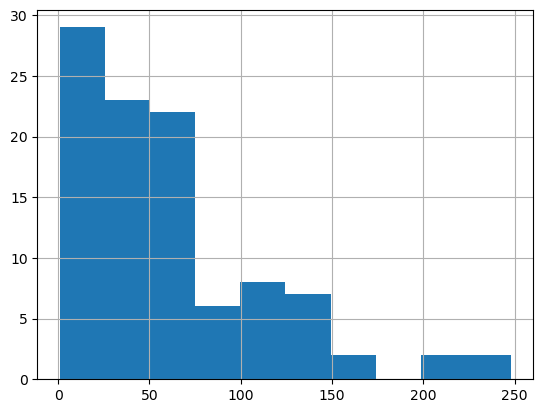

In [24]:
print(cluster_counts['count'].describe())
cluster_counts['count'].hist()

cluster_data = cluster_counts.sort_values(by='cluster_id').set_index('cluster_id').reset_index().rename(columns={'count':'total_images', 'cluster_id': 'id'})

bins = [0, 60, 150, float('inf')]
labels = ['low density','moderate density','high density']

cluster_data['cluster_density'] = pd.cut(cluster_data['total_images'], bins=bins, labels=labels)

we can see there is an outliers, there are clusters that have no more then `1%` of total images, most likely these cluster have repetitive images (duplicate / near duplicate images) that don't have any patterns, we will try to investigate the possibility of merging these clusters

In [25]:
cluster_dist = data['cluster_id'].value_counts(normalize=True) * 100
mini_cluster = cluster_dist[cluster_dist <= 1].index

print(f"there is {len(mini_cluster)} clusters that have less then 1% from the total images")

there is 66 clusters that have less then 1% from the total images


#### 2. relationship between cluster_id and total faces

count    6125.000000
mean        0.253224
std         0.933820
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        22.000000
Name: total_faces, dtype: float64


<Axes: >

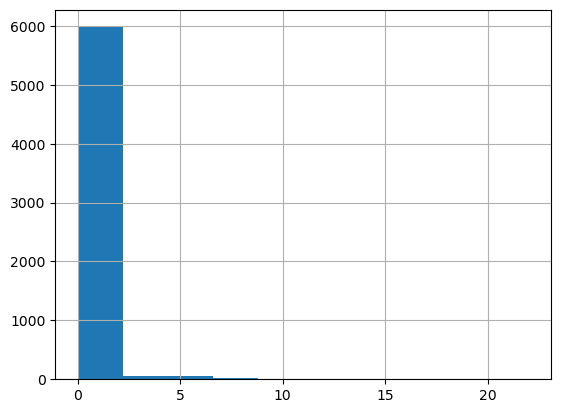

In [26]:
print(data['total_faces'].describe())
data['total_faces'].hist()

there is an outliers

count    101.000000
mean      15.356436
std       48.627890
min        0.000000
25%        0.000000
50%        0.000000
75%        7.000000
max      311.000000
Name: total_faces, dtype: float64


<Axes: >

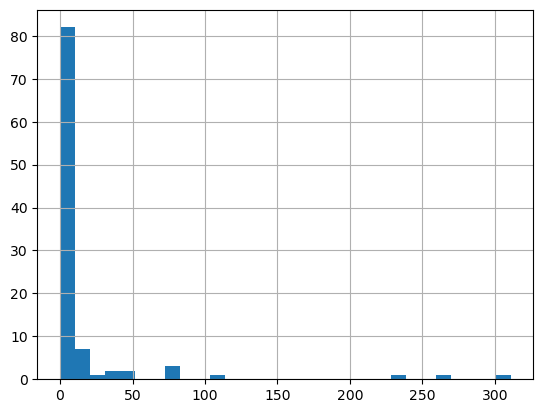

In [27]:
total_faces_in_clusters = data.groupby('cluster_id')['total_faces'].sum().reset_index()

print(total_faces_in_clusters['total_faces'].describe())
total_faces_in_clusters['total_faces'].hist(bins=30)

In [28]:
bins = [-1, 0, 50, 200, float('inf')]
labels = ['no faces', 'little faces', 'average faces', 'most faces']

def get_total_faces_per_cluster(cluster_id):
    return total_faces_in_clusters[total_faces_in_clusters['cluster_id'] == cluster_id].total_faces.iloc[0]

cluster_data['total_faces'] = cluster_data['id'].apply(get_total_faces_per_cluster)
cluster_data['faces_categories'] = pd.cut(cluster_data['total_faces'], bins=bins, labels=labels)

In [29]:
fig = px.bar(total_faces_in_clusters, x='cluster_id', y='total_faces')


fig.update_layout(
    title_text="Cluster Analysis by Face Count",
    height=600,
    width=1000,
    showlegend=False
)

fig.show()


In [30]:
no_faces_clusters = list(total_faces_in_clusters[total_faces_in_clusters['total_faces'] == 0]['cluster_id'])
most_faces_clusters = list(total_faces_in_clusters[total_faces_in_clusters['total_faces'] >= 200]['cluster_id'])


print(f"no faces clusters: {no_faces_clusters}")
print(f"most faces clusters: {most_faces_clusters}")

no faces clusters: [2, 4, 10, 12, 14, 19, 20, 23, 24, 26, 27, 28, 29, 31, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 48, 51, 52, 53, 55, 56, 60, 62, 65, 66, 68, 69, 70, 71, 72, 74, 75, 76, 78, 79, 82, 83, 86, 88, 89, 90, 91, 93, 94, 95, 96, 97, 99]
most faces clusters: [49, 58, 80]


* the clusters `{49, 58, 80}` have most faces
* and `{2, 4, 10, 12, 14, 19, 20, 23, 24, 26, 27, 28, 29, 31, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 48, 51, 52, 53, 55, 56, 60, 62, 65, 66, 68, 69, 70, 71, 72, 74, 75, 76, 78, 79, 82, 83, 86, 88, 89, 90, 91, 93, 94, 95, 96, 97, 99}` have no faces at all

#### 3. relationship between cluster_id and objects

In [31]:
def add_comma_prefix(objects_label):
    return "," + objects_label

data['edited_object_label'] = data['objects_label'].apply(add_comma_prefix)
objects_in_cluster = data.groupby('cluster_id')['edited_object_label'].sum().reset_index()
objects_in_cluster



objects_in_cluster['objects_list'] = [set(str(objects_list).split(",")[1:]) for objects_list in objects_in_cluster['edited_object_label']]


In [32]:
objects = set([object for objects_list in objects_in_cluster['objects_list'] for object in objects_list])

In [33]:
categories = {
    'Animals': {
        'bear', 'bird', 'cat', 'cow', 'dog', 'elephant', 'giraffe', 
        'horse', 'sheep', 'zebra'
    },
    'Food': {
        'apple', 'banana', 'broccoli', 'cake', 'carrot', 'donut', 
        'hot dog', 'orange', 'pizza', 'sandwich',
        'bottle', 'bowl', 'cup', 'fork', 'knife', 'spoon', 'wine glass', 'vase'
    },
    'Indoor': {
        'bed', 'bench', 'chair', 'couch', 'dining table', 'toilet',
        'clock', 'fire hydrant', 'potted plant', 'scissors', 
        'sink', 'teddy bear', 'toothbrush',
        'oven', 'remote', 'refrigerator', 'tv', 'hair drier', 'toothbrush'
    },
    'Electronics': {
        'cell phone', 'keyboard', 'laptop', 'microwave', 'mouse', 
    },
    'Sports': {
        'baseball bat', 'baseball glove', 'frisbee', 'kite', 
        'skateboard', 'skis', 'snowboard', 'sports ball', 
        'surfboard', 'tennis racket'
    },
    'Personal Items': {
        'backpack', 'handbag', 'suitcase', 'umbrella', 'tie'
    },
    'Outdoor': {
        'parking meter', 'stop sign', 'traffic light',
        'airplane', 'bicycle', 'boat', 'bus', 'car', 'motorcycle', 
        'train', 'truck'
    },
    'Book': {
        'book'
    },
    'People': {
        'person'
    },
    'Miscellaneous': {
        'no_objects'
    }
}

object_to_category = {}

for category, objects in categories.items():
    for obj in objects:
        object_to_category[obj] = category

def map_objects_to_categories(objects_list):
    return [object_to_category.get(obj, 'Unknown') for obj in objects_list]

def get_most_common_category(categories_list):
    return [element[0] for element in Counter(categories_list).most_common(1)][0]

objects_in_cluster['categories_list'] = objects_in_cluster['objects_list'].apply(map_objects_to_categories)
objects_in_cluster['most_common_categories'] = objects_in_cluster['categories_list'].apply(get_most_common_category)

In [34]:
def get_most_common_category_in_cluster(cluster_id):
    return objects_in_cluster[objects_in_cluster['cluster_id'] == cluster_id]['most_common_categories'].iloc[0]

cluster_data['common_object_label'] = cluster_data['id'].apply(get_most_common_category_in_cluster)

#### 4. relationship between cluster_id and folder

In [ ]:
fig = px.histogram(data, x='cluster_id', color='folder', 
                   title='Distribution of Folders Across Clusters',
                   labels={'cluster_id': 'Cluster ID', 'folder': 'Folder'},
                   barmode='group',
                  )

fig.update_layout(legend=dict(
    title='Folder',
    yanchor="top",
    y=1,
    xanchor="left",
    x=1.02
))

fig.show()

In [36]:
def get_dominant_folder(id):
    return Counter(list(data[data['cluster_id'] == id]['folder'])).most_common(1)[0][0]

cluster_data['dominant_folder'] = cluster_data['id'].apply(get_dominant_folder)

#### 5. relationship between cluster_id and background class

In [37]:
def add_comma_space_prefix(bg_class):
    if type(bg_class) == str:
        return ", " + bg_class
    return ""

data['edited_background_class'] = data['background_class'].apply(add_comma_space_prefix)
background_class_in_cluster = data.groupby('cluster_id')['edited_background_class'].sum().reset_index()

background_class_in_cluster['backgrounds_list'] = [set(str(background_list).split(", ")[1:]) for background_list in background_class_in_cluster['edited_background_class']]

In [38]:
backgrounds = set([background for backgrounds_list in background_class_in_cluster['backgrounds_list'] for background in backgrounds_list])

In [39]:
categories = {
    "Animals": [
        'Alopex lagopus', 'Arctic fox', 'Bonasa umbellus', 'Carduelis carduelis', 
        'Chihuahua', 'Dandie Dinmont', 'Dandie Dinmont terrier', 'Dermochelys coriacea', 
        'Dugong dugon', 'Egretta albus', 'Fringilla montifringilla', 'Great Pyrenees', 
        'Hungarian pointer', 'Indian cobra', 'Naja naja', 'Orcinus orca', 
        'Pan troglodytes', 'Panthera leo', 'Panthera pardus', 'Samoyed', 
        'Samoyede', 'Strix nebulosa', 'Sussex spaniel', 'Syrian egret', 
        'Syrian robin', 'Thalarctos maritimus', 'Turdus migratorius', 'Ursus Maritimus', 
        'Weimaraner', 'West Highland white terrier', 'badger', 'basset', 
        'basset hound', 'brambling', 'carriage dog', 'chickadee', 
        'chimp', 'bittern', 'chimpanzee', 'clumber', 
        'clumber spaniel', 'coach dog', 'crampfish', 'dalmatian', 
        'dugong', 'electric ray', 'gazelle', 'goldfinch', 
        'grampus', 'great gray owl', 'great grey owl', 'great white heron',
        'isopod', 'jellyfish', 'killer', 'killer whale', 
        'king of beasts', 'kuvasz', 'leatherback', 'leatherback turtle', 
        'leathery turtle', 'leopard', 'lion', 'nematode', 
        'nematode worm', 'numbfish', 'orca', 'partridge',
        'peacock', 'polar bear', 'ptarmigan', 'puff',
        'robin', 'roundworm', 'ruffed grouse', 'sea urchin',
        'sea wolf', 'tabby', 'tabby cat', 'titi',
        'titi monkey', 'tusker', 'vizsla', 'whippet',
        'whiptail', 'whiptail lizard', 'white fox', 'zebra'
    ],
    "Clothing & Accessories": [
        'Band Aid', 'T-shirt', 'abaya', 'academic gown', 
        'academic robe', 'apron', 'bandeau', 'bathing cap', 
        'bathing trunks', 'bib', 'bikini', 'blue jean', 
        'bow tie', 'bow-tie', 'bowtie', 'bra', 
        'brassiere', 'breastplate', 'bulletproof vest', 'capitulum', 
        'cardigan', 'cathode-ray oscilloscope', 'gown', 'Windsor tie',
        'cloak', 'clog', 'cowboy boot', 'cowboy hat', 
        'crinoline', 'dark glasses', 'denim', 'diaper', 
        'digital watch', 'doormat', 'dust cover', 'dust jacket', 
        'dust wrapper', 'ear', 'face powder', 'feather boa', 
        'fur coat', 'gas helmet', 'gasmask', 'geta',
        'hair slide', 'handkerchief', 'hankey', 'hankie', 
        'hanky', 'hoopskirt', 'jammies', 'jean', 
        'jersey', 'judge\'s robe', 'kimono', 'knee pad', 
        'lab coat', 'laboratory coat', 'lip rouge', 'lipstick', 
        'maillot', 'mask', 'military uniform', 'miniskirt', 
        'mitten', 'mortarboard', 'mosquito net', 'neck brace', 
        'necklace', 'nappy', 'oxygen mask', 'pajama', 
        'patten', 'pj\'s', 'poke bonnet', 'purse',
        'pyjama', 'running shoe', 'sabot', 'safety pin',
        'sandal', 'sarong', 'scabbard', 'seat belt',
        'seatbelt', 'shades', 'shako', 'shoe shop',
        'shoe store', 'shoe-shop', 'shoji', 'shopping basket',
        'shower cap', 'ski mask', 'sleeping bag', 'smoothing iron',
        'snorkel', 'sock', 'sombrero', 'stole',
        'suit', 'suit of clothes', 'sun blocker', 'sunblock',
        'sunglass', 'sunglasses', 'sunscreen', 'sweatshirt',
        'swimming cap', 'swimming trunks', 'tank suit', 'tee shirt',
        'ten-gallon hat', 'thimble', 'trench coat', 'two-piece',
        'umbrella', 'vestment', 'wig', 'window screen',
        'window shade', 'wine bottle', 'wing'
    ],
    "Food & Drinks": [
        'French loaf', 'Granny Smith', 'artichoke', 'banana', 
        'beer bottle', 'beer glass', 'beigel', 'bell pepper', 
        'bib', 'bagel', 'carbonara', 'cheeseburger', 
        'burrito', 'ananas', 'broccoli', 'cauliflower',
        'chocolate sauce', 'chocolate syrup', 'cocktail shaker', 'coffeepot', 
        'comic book', 'confectionary', 'confectionery', 'consomme', 
        'corn', 'courgette', 'cuke', 'cucumber', 
        'eggnog', 'espresso', 'fig', 'globe artichoke', 
        'guacamole', 'honeycomb', 'hot dog', 'hot pot', 
        'hotdog', 'hotpot', 'ice cream', 'ice lolly', 
        'icecream', 'lollipop', 'lolly', 'meat loaf', 
        'meatloaf', 'orange', 'pear', 'pineapple',
        'pizza', 'pizza pie', 'pop bottle', 'popsicle',
        'potpie', 'pretzel', 'rapeseed', 'red hot',
        'red wine', 'soda bottle', 'soup bowl', 'spaghetti squash',
        'strawberry', 'sweet potato', 'trifle', 'water bottle',
        'water jug', 'zucchini',
        'Crock Pot', 'caldron', 'cauldron', 'cup', 'frying pan', 'frypan',
        'ladle', 'measuring cup', 'mixing bowl', 'plate', 'plate rack',
        'pot', 'salt shaker', 'saltshaker', 'skillet', 'soap dispenser',
        'spatula', 'stove', 'strainer', 'table lamp', 'teapot', 'toaster',
        'waffle iron', 'wooden spoon', 'bakehouse', 'bakery', 'bakeshop',
        'candy store', 'coffeepot', 'dining table', 'fork', 'knife',
        'microwave', 'microwave oven', 'napkin', 'paper towel', 'spoon',
        'toilet paper', 'toilet tissue', 'vase', 'water bottle', 'water jug'
    ],
    "Household Items": [
        'Petri dish', 'abacus', 'ash bin', 'ash-bin', 'ashbin', 'ashcan', 
        'automatic washer', 'bath towel', 'bathroom tissue', 'beaker', 
        'book jacket', 'bookcase', 'bookshop', 'bookstall', 'bookstore', 
        'bottle screw', 'comic book', 'broom', 'bucket', 'buckle', 'cab', 
        'candle', 'carton', 'chest', 'chiffonier', 'cassette', 'cassette player', 
        'chopper', 'cleaver', 'closet', 'coil', 'comfort', 'comforter', 'commode', 
        'conch', 'cot', 'cradle', 'crib', 'crutch', 'day bed', 'desk', 'diaper', 
        'digital clock', 'doormat', 'drum', 'drumstick', 'dumbbell', 'dustbin', 
        'envelope', 'fiddle', 'file', 'file cabinet', 'filing cabinet', 'fire screen', 
        'fireguard', 'flowerpot', 'folding chair', 'footstall', 'forklift', 
        'fountain pen', 'four-poster', 'garbage can', 'grand piano', 'guillotine', 
        'hair drier', 'hair dryer', 'hair spray', 'hammer', 'hamper', 'hand blower', 
        'handbasin', 'handkerchief', 'hankey', 'hankie', 'hanky', 'harmonica', 
        'harp', 'hatchet', 'head', 'helix', 'hook', 'hourglass', 'iron', 
        "jack-o'-lantern", 'jigsaw puzzle', 'joystick', 'keypad', 'kite', 'knot', 
        'lamp shade', 'lampshade', 'lavabo', 'lawn mower', 'letter opener', 
        'library', 'lighthouse', 'lotion', 'loudspeaker', 'loudspeaker system', 
        'loupe', 'mailbag', 'maraca', 'marimba', 'matchstick', 'maypole', 
        'meat cleaver', 'medicine cabinet', 'medicine chest', 'memorial tablet', 
        'menu', 'merry-go-round', 'microphone', 'mike', 'modem', 'monitor', 'mop', 
        'mortar', 'mosquito net', 'mountain tent', 'mouse', 'mouth harp', 
        'mouth organ', 'moving van', 'mower', 'nappy', 'necklace', 'notebook', 
        'notecase', 'obelisk', 'oboe', 'ocarina', 'one-armed bandit', 
        'opera glasses', 'oscilloscope', 'packet', 'paddle', 'pail', 'paintbrush', 
        'pajama', 'paling', 'pandean pipe', 'panpipe', 'paper knife', 'paperknife', 
        'parachute', 'park bench', 'patio', 'pay-phone', 'pay-station', 'pedestal', 
        'pencil eraser', 'perfume', 'photocopier', 'pick', 'pill bottle', 'pillow', 
        'pinwheel', 'plaque', 'plastic bag', 'plectron', 'plectrum', 'plinth', 
        "plumber's helper", 'plunger', 'pocketbook', 'pole', 'pool table', 
        'postbag', 'potter\'s wheel', 'power drill', 'press', 'punch bag', 
        'punchball', 'punching bag', 'punching ball', 'quill', 'quill pen', 
        'quilt', 'radiator', 'remote', 'remote control', 'respirator', 
        'ring-binder', 'rocker', 'rocking chair', 'rotisserie', 'rubber', 
        'rubber eraser', 'scale', 'scooter', 'scope', 'scoreboard', 'screen', 
        'screwdriver', 'sewing machine', 'shield', 'shovel', 'shower curtain', 
        'sliding door', 'slot', 'solar collector', 'solar dish', 'solar furnace', 
        'speaker', 'speaker system', 'speaker unit', 'spider web', "spider's web", 
        'spike', 'spot', 'spotlight', 'stage', 'steel drum', 'stethoscope', 
        'stone wall', 'stop watch', 'stoplight', 'stopwatch', 'street sign', 
        'stretcher', 'studio couch', 'stupa', 'swab', 'swob', 'syringe', 'syrinx', 
        'tam-tam', 'tape player', 'taper', 'teddy', 'teddy bear', 'television', 
        'television system', 'tennis ball', 'terrace', 'thatch', 'thatched roof', 
        'theater curtain', 'theatre curtain', 'throne', 'toilet seat', 'tool kit', 
        'tope', 'torch', 'totem pole', 'toy shop', 'toyshop', 'tray', 'tricycle', 
        'trike', 'trombone', 'tub', 'turnstile', 'typewriter keyboard', 'upright', 
        'upright piano', 'vacuum', 'vacuum cleaner', 'vat', 'vault', 'velvet', 
        'vending machine', 'violin', 'violoncello', 'volute', 'wagon', 'wall clock', 
        'wallet', 'wardrobe', 'wash-hand basin', 'washbasin', 'washbowl', 'washer', 
        'washing machine', 'wastebin', 'wax light', 'weighing machine', 
        'welcome mat', 'whistle', 'whirligig', 'wool', 'woolen', 'woollen', 
        'worm fence', 'wreck', 'wrecker', 'xylophone', 'yurt'
    ],
    "Electronics & Machines": [
        'ATM', 'CD player', 'CRO', 'CRT screen', 
        'automated teller', 'automated teller machine', 'automatic teller', 
        'automatic teller machine', 'blow drier', 'blow dryer', 'cell', 
        'cellphone', 'cellular phone', 'cellular telephone', 'cathode-ray oscilloscope',
        'computer keyboard', 'computer mouse', 'desktop computer', 'digital watch', 
        'entertainment center', 'fixed disk', 'hand-held computer', 
        'hand-held microcomputer', 'hard disc', 'hard disk', 'home theater', 
        'home theatre', 'internet site', 'keypad', 'laptop', 
        'laptop computer', 'modem', 'monitor', 'mouse', 
        'notebook computer', 'oscilloscope', 'radio', 'telephone',
        'photocopier', 'power drill', 'radio reflector', 'radio telescope',
        'remote', 'remote control', 'sewing machine', 'solar collector',
        'solar dish', 'solar furnace', 'space heater', 'tape player',
        'television', 'television system', 'typewriter keyboard', 'vacuum',
        'vacuum cleaner', 'vending machine', 'wireless', 'web site',
        'website'
    ],
    "Vehicles & Transportation": [
        'Model T', 'airliner', 'airship', 'all-terrain bike', 
        'ambulance', 'amphibian', 'amphibious vehicle', 'armored combat vehicle', 
        'armoured combat vehicle', 'army tank', 'articulated lorry', 'assault gun', 
        'bicycle-built-for-two', 'bobsled', 'bobsleigh', 'canoe', 
        'car mirror', 'carriage', 'articulated lorry', 'chopper', 
        'coach', 'container ship', 'container vessel', 'containership', 
        'convertible', 'dirigible', 'dog sled', 'dog sleigh', 
        'dogsled', 'drilling platform', 'forklift', 'gondola',
        'half track', 'limo', 'limousine', 'minibus', 
        'minivan', 'missile', 'mobile home', 'monocycle', 
        'motor scooter', 'mountain bike', 'moving van', 'off-roader', 
        'offshore rig', 'paddy wagon', 'passenger car', 'patrol wagon',
        'police van', 'police wagon', 'race car', 'racer',
        'racing car', 'rig', 'rotisserie', 'roundabout',
        'scooter', 'semi', 'snowmobile', 'snowplough',
        'snowplow', 'streetcar', 'tandem', 'tandem bicycle',
        'tank', 'taxi', 'taxicab', 'tow car',
        'tow truck', 'tractor trailer', 'trailer truck', 'tram',
        'tramcar', 'trolley', 'trolley car', 'trucking rig',
        'unicycle', 'velocipede', 'viaduct', 'wagon'
    ],
    "Musical Instruments": [
        'bassoon', 'banjo', 'acoustic guitar', 'brass', 
        'cello', 'drum', 'flute', 'gong', 
        'grand piano', 'fiddle', 'harmonica', 'harp', 
        'hautbois', 'hautboy', 'maraca', 'marimba', 
        'membranophone', 'microphone', 'mike', 'mouth harp', 
        'mouth organ', 'oboe', 'ocarina', 'pandean pipe', 
        'panpipe', 'steel drum', 'syrinx', 'tam-tam',
        'trombone', 'tympan', 'violin', 'violoncello',
        'xylophone'
    ],
    "Buildings & Structures": [
        'barn', 'boathouse', 'castle', 'Virginia fence', 
        'chainlink fence', 'altar', 'beacon', 'beacon light', 
        'bookshop', 'bookstore', 'candy store', 'church', 
        'church building', 'cinema', 'cliff', 'coast', 
        'coral reef', 'dam', 'dike', 'dock', 
        'dockage', 'docking facility', 'dome', 'drilling platform', 
        'eatery', 'eating house', 'eating place', 'food market', 
        'foreland', 'geyser', 'grocery', 'grocery store',
        'hack', 'headland', 'labyrinth', 'lakeshore', 
        'lakeside', 'library', 'lighthouse', 'megalith', 
        'megalithic structure', 'monastery', 'mosque', 'movie house', 
        'movie theater', 'movie theatre', 'palace', 'patio',
        'pharos', 'picket fence', 'picture palace', 'pier',
        'planetarium', 'plaque', 'prison', 'prison house',
        'promontory', 'restaurant', 'roundabout', 'sand bar',
        'sandbar', 'sea-coast', 'seacoast', 'seashore',
        'site', 'stage', 'steel arch bridge', 'stupa',
        'suspension bridge', 'terrace', 'theater curtain', 'theatre curtain',
        'throne', 'tobacco shop', 'tobacconist', 'tobacconist shop',
        'triumphal arch', 'vale', 'valley', 'viaduct',
        'volcano', 'yurt'
    ],
    "Nature & Plants": [
        'acorn', 'alp', 'ananas', 'artichoke', 
        'banana', 'bell pepper', 'broccoli', 'cauliflower', 
        'Granny Smith', 'chocolate sauce', 'chocolate syrup', 'cliff', 
        'coast', 'coral reef', 'corn', 'courgette', 
        'cucumber', 'cuke', 'daisy', 'fig', 
        'globe artichoke', 'hay', 'head cabbage', 'honeycomb', 
        'mushroom', 'orange', 'pear', 'pineapple',
        'rapeseed', 'sand bar', 'sandbar', 'sea-coast',
        'seacoast', 'seashore', 'sorrel', 'spaghetti squash',
        'spider web', 'spider\'s web', 'strawberry', 'sweet potato',
        'thatch', 'thatched roof', 'volcano', 'zucchini'
    ],
    "Weapons & Armor": [
        'assault rifle', 'aegis', 'buckler', 'breastplate', 
        'bulletproof vest', 'chopper', 'cleaver', 'guillotine',
        'hammer', 'hatchet', 'knife', 'letter opener', 
        'meat cleaver', 'missile', 'paddle', 'sword',
        'pick', 'projectile', 'revolver', 'scabbard',
        'shield', 'six-gun', 'six-shooter', 'spear',
        'torpedo'
    ],
    "Sports & Recreation": [
        'balance beam', 'barbell', 'billiard table', 'bobsled', 
        'bobsleigh', 'bow', 'canoe', 'croquet ball', 
        'crossword', 'crossword puzzle', 'dumbbell', 'golf ball',
        'high bar', 'hockey puck', 'horizontal bar', 'jigsaw puzzle', 
        'kite', 'parallel bars', 'park bench', 'soccer ball',
        'ping-pong ball', 'pool table', 'puck', 'racket',
        'racquet', 'roundabout', 'ski', 'snooker table',
        'tennis ball', 'trampoline', 'volleyball', 'whistle'
    ],
    "Tools & Utensils": [
        'Biro', 'ballpen', 'ballpoint', 'ballpoint pen', 
        'binder', 'binoculars', 'boat paddle', 'bottle screw', 
        'broom', 'bucket', 'candle', 'cassette', 
        'cassette player', 'chain', 'chopper', 'cleaver', 
        'corkscrew', 'crutch', 'cup', 'fountain pen', 
        'frying pan', 'frypan', 'field glasses',
        'hammer', 'hatchet', 'hook', 'iron', 
        'jeweler\'s loupe', 'joystick', 'ladle', 'letter opener', 
        'measuring cup', 'meat cleaver', 'mixing bowl', 'mop', 
        'paddle', 'paintbrush', 'paper knife', 'paperknife', 
        'scissors', 'screwdriver', 'pick', 'pencil eraser',
        'plumber\'s helper', 'plunger', 'potter\'s wheel', 'press',
        'rubber', 'rubber eraser', 'salt shaker', 'saltshaker',
        'scale', 'shovel', 'skillet', 'spatula',
        'strainer', 'swab', 'swob', 'syringe',
        'thimble', 'torch', 'tray', 'wooden spoon'
    ]
}

# First, create the object to category mapping
background_to_category = {}

for category, objects in categories.items():
    for obj in objects:
        background_to_category[obj] = category

# Function to map objects to categories
def map_backgrounds_to_categories(backgrounds_set):
    return [background_to_category.get(obj, 'Unknown') for obj in backgrounds_set]

# Function to get the most common category
def get_most_common_category(categories_list):
    if not categories_list:
        return 'Unknown'
    return Counter(categories_list).most_common(1)[0][0]

# Apply the mapping to your dataframe
background_class_in_cluster['categories_list'] = background_class_in_cluster['backgrounds_list'].apply(map_backgrounds_to_categories)
background_class_in_cluster['most_common_category'] = background_class_in_cluster['categories_list'].apply(get_most_common_category)

In [40]:
def get_most_common_category_in_cluster(cluster_id):
    return background_class_in_cluster[background_class_in_cluster['cluster_id'] == cluster_id]['most_common_category'].iloc[0]

cluster_data['common_background_class'] = cluster_data['id'].apply(get_most_common_category_in_cluster)

#### 6. relationship between cluster_id and caption with text

In [41]:
def clean_and_analyze_text(caption_series, text_series):
    
    all_text = caption_series + text_series
    words = all_text.split()
    
    english_stopwords = set(stopwords.words('english'))
    # Add the words to exclude to the stopwords set
    words_to_exclude = {'front', 'top','whole', 'for','peppa','the', 'group', 'around', 'with', 'person', 'no_text', 'woman', 'man', 'people', 'photography', 'background', 'picture', 'image', 'pictures', 'red', 'white', 'blue', 'black', 'pink'}
    all_stopwords = english_stopwords.union(words_to_exclude)
    
    words = [word.lower() for word in words if word not in all_stopwords and len(word) > 2 and word.lower() != "the" and word.lower() != "for" and not word.endswith('ing')]
    word_freq = Counter(words)
    
    return [word[0] for word in word_freq.most_common(10)]

def get_caption_and_text(cluster_id):
    sub_caption_and_text_in_cluster = caption_and_text_in_cluster[caption_and_text_in_cluster['cluster_id'] == cluster_id]
    return clean_and_analyze_text(sub_caption_and_text_in_cluster['edited_caption'].iloc[0], sub_caption_and_text_in_cluster['edited_text'].iloc[0])


def add_space_prefix(bg_class):
    if type(bg_class) == str:
        return " " + bg_class
    return ""

data['edited_caption'] = data['caption'].apply(add_space_prefix)
data['edited_text'] = data['text'].apply(add_space_prefix)

caption_and_text_in_cluster = data.groupby('cluster_id')[['edited_caption', 'edited_text']].sum().reset_index()

caption_and_text_in_cluster['most_common_text'] = caption_and_text_in_cluster['cluster_id'].apply(get_caption_and_text)



In [42]:
categories = {
    "Food & Drinks": {
        'chopped','containers', 
        'beans', 'broccoli', 'broccoli,', 'cereal,', 'cheese', 'chicken', 
        'chicken,', 'chocolate', 'coffee', 'corn,', 'cream', 'dinner', 
        'drinks', 'egg', 'eggs,', 'food', 'foods', 'fork', 'fruit', 
        'fruits', 'lunch', 'meal', 'pasta', 'pepper', 'picnic', 'salad', 
        'sauce', 'sliced', 'snack', 'soda', 'sodas', 'soup', 'spoon', 
        'strawberries', 'tea', 'tomatoes', 'tomatoes,', 'watermelon', 'wheat', 
        'wine',  'vegetables',
    },
    "Clothing & Accessories": {
        'bag', 'bracelet', 'bracelets', 'coat', 'denim', 'dress', 'dresses', 
        'glasses', 'hat', 'hat,', 'jacket', 'jeans', 'necklace', 'outfit', 'colored', 'colorful',
        'outfits', 'pants', 'purse', 'purse,', 'sari', 'shirt', 'shoes', 'leather', 'piece', 'pieces','wrist',
        'shoes,', 'skirt', 'sunglasses', 'sunglasses,', 'suit', 'suits', 'sneakers',
        'tie', 'watch', 'watch,', 'watches', 'wedges', 'casual', 'outfit', 'outfits'
    },
    "Nature & Outdoors": {
        'air', 'aurora', 'beach', 'bird', 'branch', 'earth', 'field', 
        'flower', 'flowers', 'galaxy', 'grass', 'green', 'ground', 'hill', 
        'lake', 'lawn', 'lemon', 'light', 'mountain', 'mountains', 'ocean', 
        'owl', 'owls', 'palm', 'plant', 'road', 'rock', 'sand', 'sky', 
        'snow', 'snowy', 'space', 'stars', 'street', 'sunset', 'tree', 
        'trees', 'water', 'waterfall', 'woods', 'yellow'
    },
    "Household Items": {
        'blanket', 'board', 'bowl', 'bowls', 'brush', 
        'calendar', 'candles', 'capsule', 'chair', 'chairs', 'clock', 
        'couch', 'cup', 'desk', 'desk,', 'door', 'drawing', 'fire', 
        'flag', 'flags', 'floor', 'folder', 'glass', 'lamp', 'mirror', 
        'monitor', 'page', 'paint', 'palette', 'pan', 'paper', 'plate',
        'plates', 'pool', 'poster', 'screen', 'skillet', 'slide', 'room'
        'staircase', 'table', 'tables', 'tablespoon', 'wall', 'wooden',
    },
    "Technology & Office": {
        'camera', 'cell', 'code', 'computer', 'data', 'dell', 'education', 'kernel', 'key',
        'language','line','min', 'new', 'next', 'number', 'pair','per', 'public','stock','type', 
        'file', 'git', 'import', 'intelligence', 'keyboard', 'laptop', 'higher', 'notebook', 
        'machine', 'phone', 'photo', 'print', 'python', 'repository', 'international', 
        'school', 'technology', 'university', 'web', 'words', 'logo', 'aly', 'buildings', 'city', 'diploma', 'ean',
    },
    "People & Relationships": {
        'author', 'baby', 'bride', 'children', 'couple', 'crowd', 'face', 
        'friends', 'girl', 'groom', 'hand', 'hands', 'older', 'people', 
        'princess', 'selfie', 'staff', 'women', 'you', 'your'
    },
    "Activities & Events": {
        'art', 'band', 'bar', 'birthday', 'breakfast', 'camp', 'campus', 
        'care', 'chess', 'collage', 'concert', 'cook', 'country', 
        'courtyard', 'daily', 'decorations', 'div', 'drive', 'edit', 
        'evening', 'fashion', 'fitness', 'fireworks', 'game', 'gym', 
        'health', 'healthy', 'hello', 'help', 'history', 'home', 'life', 
        'mental', 'military', 'music', 'news', 'newspaper', 'office', 
        'parade', 'park', 'party', 'plan', 'pose', 'public', 'quote', 
        'read', 'restaurant', 'rit', 'routine', 'row', 'sad', 'series', 
        'shop', 'sidewalk', 'sign', 'snowboarder', 'snowman', 'summer', 
        'theme', 'times', 'total', 'travel', 'tuition', 'variety', 'ken', 
        'version', 'view', 'week', 'workout', 'world', 'year', 'yoga', 
        'york', 'poster', 'book', 'books', 'van', 
    },
    "Sports & Fitness": {
        'barbell', 'dumb', 'fitness', 'gym', 'hard', 'health', 'healthy', 
        'mercurial', 'muscles', 'protein', 'pull', 'reps', 'routine', 
        'row', 'workout', 'yoga'
    },
    "Animals": {
        'bird', 'cat', 'chicken', 'chicken,', 'owl', 'owls', 'pig'
    },
    "Miscellaneous": {
        'add', 'added', 'ago', 'anchor', 'best', 'big', 'bound', 
        'brown', 'bunch',  'circle', 
        'close',  'commit', 
        'covered', 'curls', 'different', 'ess', 'fat', 
        'filled', 'flash', 'four', 'freedom', 'fresh', 'full', 'future', 
        'gold', 'happy', 'hidden',  'image', 
         'large', 'lay', 
        'limit',  'little',  'long', 'look', 'lot', 
        'maroon', 'mat', 'middle', 
         'pearls', 'perched', 
         'plan', 'planet', 'powder', 
        'princess',  'purple', 'raider', 'root', 'secret', 
        'sesame', 'set', 'skin', 'small', 'soft', 'sot', 
         'striped', 'surface', 'sword', 'tall', 'term', 'this', 
        'three', 'tomb', 'tor', 'tower', 'two', 'used', 
        'with', 
    }
}


word_to_category = {}

for category, objects in categories.items():
    for obj in objects:
        word_to_category[obj] = category

def map_words_to_categories(backgrounds_set):
    return [word_to_category.get(obj, 'Unknown') for obj in backgrounds_set]

# Function to get the most common category
def get_most_common_category(categories_list):
    if not categories_list:
        return 'Unknown'
    return Counter(categories_list).most_common(1)[0][0]

# Apply the mapping to your dataframe
caption_and_text_in_cluster['categories_list'] = caption_and_text_in_cluster['most_common_text'].apply(map_words_to_categories)
caption_and_text_in_cluster['most_common_category'] = caption_and_text_in_cluster['categories_list'].apply(get_most_common_category)


In [43]:
def get_most_common_category_in_cluster(cluster_id):
    return caption_and_text_in_cluster[caption_and_text_in_cluster['cluster_id'] == cluster_id]['most_common_category'].iloc[0]

cluster_data['common_context_theme'] = cluster_data['id'].apply(get_most_common_category_in_cluster)

In [44]:
cluster_data = cluster_data.drop(columns=["total_faces"])
cluster_data

,id,total_images,cluster_density,faces_categories,common_object_label,dominant_folder,common_background_class,common_context_theme
0,-1,10,low density,little faces,Food,camera,Buildings & Structures,Clothing & Accessories
1,0,126,moderate density,little faces,Indoor,screenshot,Clothing & Accessories,Miscellaneous
2,1,27,low density,little faces,Indoor,myPhoto,Household Items,Activities & Events
3,2,66,moderate density,no faces,Food,myPhoto,Clothing & Accessories,Household Items
4,3,4,low density,little faces,Food,camera,Buildings & Structures,Food & Drinks
...,...,...,...,...,...,...,...,...
96,95,1,low density,no faces,Food,media,Household Items,Household Items
97,96,5,low density,no faces,Food,media,Tools & Utensils,Nature & Outdoors
98,97,103,moderate density,no faces,Indoor,screenshot,Electronics & Machines,Technology & Office
99,98,134,moderate density,little faces,Indoor,screenshot,Buildings & Structures,Activities & Events


In [45]:
cluster_data.drop(columns=['id', 'total_images']).duplicated().sum()

18

In [46]:
fig = px.sunburst(
    cluster_data,
    path=['dominant_folder', 'common_context_theme','common_background_class', 'common_object_label', 'id'],
    values='total_images',
    title='Photo Collection Hierarchy',
    width=800,
    height=800
)

# Update layout for better readability
fig.update_layout(
    margin=dict(t=50, l=0, r=0, b=0),
    uniformtext=dict(minsize=10, mode='hide')
)

fig.show()

In [47]:
len(cluster_data[cluster_data.drop(columns=['id', 'total_images']).duplicated()])

18

now we can see that there is `16` duplicate pattern in the clusters, and form the `sunburst` chart we can distinguish:
1. from the **`screenshot`** folder we have:
    * clusters `84, 64, 61, 13, 8, 6, 87, 20` all have the same categories *(Indoor, Clothing & Accessories, Clothing & Accessories)*
    * clusters `40, 26` all have the same categories *(Indoor, Household Items, Technology & Office)*
    * clusters `90, 97` all have the same categories *(Indoor, Electronics & Machines, Technology & Office)*
    * clusters `94, 15, 73` all have the same categories *(Indoor, Household Items, Activities & Events)*
    * clusters `9, 38` all have the same categories *(Food, Household Items, Activities & Events)*
    * clusters `42, 37` all have the same categories *(Food, Building & Structure, Activities & Events)*
2. from the **`media`** folder we have:
    * clusters `78, 79, 35, 68, 62, 99` all have the same categories *(Food, Food & Drink, Food & Drink)*
    * clusters `23, 45, 52, 39, 27` all have the same categories *(Food, Nature & PLants, Food & Drink)*
    * clusters `10, 66` all have the same categories *(Outdoor, Building & Structure, Miscellaneous)*
    * clusters `48, 57` all have the same categories *(Indoor, Household Items, Household Items)*
3. from the **`myPhoto`** folder we have:
    * clusters `33, 55, 75, 86` all have the same categories *(Food, Household Items, Activities & Events)*
    * clusters `1, 83` all have the same categories *(Indoor, Household Items, Activities & Events)*
    * clusters `88, 50, 43` all have the same categories *(Indoor, Clothing & Accessories, Activities & Events)*
4. from the **`camera`** folder we have:
    * clusters `80, 49` all have the same categories *(Food, Clothing & Accessories, Activities & Events)*
    * clusters `17, 58` all have the same categories *(Indoor, Clothing & Accessories, Activities & Events)*

### Duplicate Cluster Patterns (16 Total)

| Folder         | Clusters                     | Categories (context_theme `→` background_class `→` object_label)               |
|----------------|-----------------------------|-------------------------------------------------------|
| **Screenshot** | 84, 64, 61, 13, 8, 6, 87, 20 | Indoor `→` Clothing & Accessories `→` Clothing & Accessories |
|                | 40, 26                      | Indoor `→` Household Items `→` Technology & Office          |
|                | 90, 97                      | Indoor `→` Electronics & Machines `→` Technology & Office   |
|                | 94, 15, 73                  | Indoor `→` Household Items `→` Activities & Events         |
|                | 9, 38                       | Food `→` Household Items `→` Activities & Events           |
|                | 42, 37                      | Food `→` Building & Structure `→` Activities & Events      |
| **Media**      | 78, 79, 35, 68, 62, 99      | Food `→` Food & Drink `→` Food & Drink                     |
|                | 23, 45, 52, 39, 27          | Food `→` Nature & Plants `→` Food & Drink                  |
|                | 10, 66                      | Outdoor `→` Building & Structure `→` Miscellaneous         |
|                | 48, 57                      | Indoor `→` Household Items `→` Household Items             |
|                | 33, 55, 75, 86              | Food `→` Household Items `→` Activities & Events           |
|                | 1, 83                       | Indoor `→` Household Items `→` Activities & Events         |
|                | 88, 50, 43                  | Indoor `→` Clothing & Accessories `→` Activities & Events  |
| **Camera**     | 80, 49                      | Food `→` Clothing & Accessories `→` Activities & Events    |
|                | 17, 58                      | Indoor `→` Clothing & Accessories `→` Activities & Events  |

In [ ]:
def create_cluster_mapping(cluster_data):
    # Define the duplicate groups from your analysis
    duplicate_groups = [
        # Screenshot folder groups
        [84, 64, 61, 13, 8, 6, 87, 20],
        [40, 26],
        [90, 97],
        [94, 15, 73],
        [9, 38],
        [42, 37],
        
        # Media folder groups
        [78, 79, 35, 68, 62, 99],
        [23, 45, 52, 39, 27],
        [10, 66],
        [48, 57],
        # MyPhoto folder groups
        [33, 55, 75, 86],
        [1, 83],
        [88, 50, 43],
        
        # Camera folder groups
        [80, 49],
        [17, 58]
    ]
    
    # Create mapping dictionary
    cluster_map = {}
    letter_idx = 0
    
    # First map all duplicate groups
    for group in duplicate_groups:
        letter = string.ascii_uppercase[letter_idx]
        for cluster_id in group:
            cluster_map[cluster_id] = letter
        letter_idx += 1
    
    # Then map remaining unique clusters (not in any duplicate group)
    all_duplicates = {id for group in duplicate_groups for id in group}
    
    for cluster_id in cluster_data['id'].unique():
        if cluster_id not in cluster_map and cluster_id not in all_duplicates:
            # Skip -1 (noise cluster) if present
            if cluster_id == -1:
                cluster_map[cluster_id] = "Noise"
            elif letter_idx < 26:  # Only use A-Z
                cluster_map[cluster_id] = string.ascii_uppercase[letter_idx]
                letter_idx += 1
            else:
                cluster_map[cluster_id] = f"Z{letter_idx-25}"  # Continue with Z1, Z2 etc.
    
    return cluster_map

# Example usage:
cluster_mapping = create_cluster_mapping(cluster_data)

# To add the mapping to your DataFrame:
cluster_data['cluster_group'] = cluster_data['id'].map(cluster_mapping)
cluster_data

,id,total_images,cluster_density,faces_categories,common_object_label,dominant_folder,common_background_class,common_context_theme,cluster_group
0,-1,10,low density,little faces,Food,camera,Buildings & Structures,Clothing & Accessories,Noise
1,0,126,moderate density,little faces,Indoor,screenshot,Clothing & Accessories,Miscellaneous,P
2,1,27,low density,little faces,Indoor,myPhoto,Household Items,Activities & Events,L
3,2,66,moderate density,no faces,Food,myPhoto,Clothing & Accessories,Household Items,Q
4,3,4,low density,little faces,Food,camera,Buildings & Structures,Food & Drinks,R
...,...,...,...,...,...,...,...,...,...
96,95,1,low density,no faces,Food,media,Household Items,Household Items,Z1
97,96,5,low density,no faces,Food,media,Tools & Utensils,Nature & Outdoors,Z1
98,97,103,moderate density,no faces,Indoor,screenshot,Electronics & Machines,Technology & Office,C
99,98,134,moderate density,little faces,Indoor,screenshot,Buildings & Structures,Activities & Events,Z1


In [49]:
len(cluster_data['cluster_group'].unique())

28

we reduce the clusters from `101` to `28`

In [50]:
data = data.drop(columns=['edited_text', 'edited_caption', 'edited_background_class', 'edited_object_label'])

In [51]:
data = data.merge(cluster_data.drop(columns=['total_images']), left_on='cluster_id', right_on='id', how='inner').drop(columns=['id'])

In [52]:
pca = PCA(n_components=2)
features_2d = pca.fit_transform(features)

df_pca = pd.DataFrame({
    'PC1': features_2d[:, 0],
    'PC2': features_2d[:, 1],
    'Index': data.index,
    'Cluster': data['cluster_group'].astype(str)
})

fig = px.scatter(
    df_pca,
    x='PC1',
    y='PC2',
    color='Cluster',
    color_discrete_sequence=px.colors.qualitative.D3,
    title="2D PCA Projection of Image Feature Vectors",
    hover_name='Index',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'},
    width=1000,
    height=800
)

fig.update_traces(
    marker=dict(size=5, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')),
    selector=dict(mode='markers')
)

fig.show()

In [53]:
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)
df_pca = pd.DataFrame({
    'PC1': features_3d[:, 0],
    'PC2': features_3d[:, 1],
    'PC3': features_3d[:, 2],
    'Index': data.index,
    'Cluster': data['cluster_group'].astype(str)
})
fig = px.scatter_3d(
    df_pca,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    color_discrete_sequence=px.colors.qualitative.D3,
    title="3D PCA Projection of Feature Vectors (Colored by Cluster)",
    hover_name='Index',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    width=1000,
    height=800
)
fig.update_traces(
    marker=dict(
        size=4,        
        opacity=0.8,   
        line=dict(width=0.2, color='DarkSlateGrey')
    )
)
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

fig.show()

### total images per `month` and `day`

In [54]:

data['date'] = pd.to_datetime(data['date'])
data['month'] = data['date'].dt.month
data['month_name'] = data['date'].dt.month_name()

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']
data['month_name'] = pd.Categorical(data['month_name'], categories=month_order, ordered=True)

month_counts = data['month_name'].value_counts().sort_index()

fig = px.bar(
    x=month_counts.index,
    y=month_counts.values,
)

fig.update_xaxes(title_text="Month")
fig.update_yaxes(title_text="Total Images")

fig.show()

we can conclude that during December and summer the user took more images then the rest of seasons

In [55]:
data['date'] = pd.to_datetime(data['date'])
data['day'] = data['date'].dt.date

day_counts = data['day'].value_counts().sort_index()

fig = px.bar(
    x=day_counts.index,
    y=day_counts.values,
)

fig.update_xaxes(title_text="Month")
fig.update_yaxes(title_text="Total Images")

fig.show()


In [ ]:
data['day'] = pd.to_datetime(data['day'])
Nov_25_2024 = data[data['day'] == pd.to_datetime("2024-11-25")]

all_text = (' '.join(Nov_25_2024['caption'].dropna().astype(str)) 
            + ' '.join(Nov_25_2024['text'].dropna().astype(str)) 
            + ' '.join([obj for obj_list in list(Nov_25_2024['objects_label'].dropna()) for obj in obj_list.split(",")])
            + ' '.join([bg for bg_list in list(Nov_25_2024['background_class'].dropna()) for bg in bg_list.split(", ")]))

words = all_text.split()
english_stopwords = set(stopwords.words('english'))
words = [word for word in words if word.lower() not in english_stopwords and len(word) > 2]
word_freq = Counter(words)

# most common words (excluding the first which is often a stopword that slipped through)
common_words = word_freq.most_common(50)[1:]

fig = make_subplots(rows=1, cols=2, 
                   subplot_titles=(f'Most Common Words in Nov 25, 2024 images', 
                                 f'Word Cloud for Nov 25, 2024 images'),
                   column_widths=[0.5, 0.5])

fig.add_trace(
    go.Bar(
        x=[count for _, count in common_words],
        y=[word for word, _ in common_words],
        orientation='h',
        marker_color='skyblue'
    ),
    row=1, col=1
)

wordcloud = WordCloud(width=800, height=400,
                     background_color='white',
                     font_path='arial').generate(all_text)

# fig.add_layout_image(
#     dict(source=wordcloud.to_image(), xref="x2", yref="y2", x=0, y=1, sizex=1, sizey=1, xanchor="left", yanchor="top", sizing="stretch"), row=1, col=2)

# fig.update_layout(title_text=f"Text Analysis for Nov 25, 2024 images", height=600, width = 1500, showlegend=False, xaxis2={'visible': False}, yaxis2={'visible': False}, yaxis={'autorange': "reversed"}, margin=dict(t=100))

# fig.show()


![](nov_25_2024_image.png)

clearly the owner gallery have her birthday in **`Nov 25`**

In [ ]:
data['day'] = pd.to_datetime(data['day'])
Nov_25_2024 = data[data['day'].isin([pd.to_datetime("2024-12-8"), 
                                    pd.to_datetime("2024-12-10"), 
                                   ])]

all_text = (' '.join(Nov_25_2024['caption'].dropna().astype(str)) 
            + ' '.join([obj for obj_list in list(Nov_25_2024['objects_label'].dropna()) for obj in obj_list.split(",")])
            + ' '.join([bg for bg_list in list(Nov_25_2024['background_class'].dropna()) for bg in bg_list.split(", ")]))

words = all_text.split()
english_stopwords = set(stopwords.words('english'))
words = [word for word in words if word.lower() not in english_stopwords and len(word) > 2]
word_freq = Counter(words)

# most common words (excluding the first which is often a stopword that slipped through)
common_words = word_freq.most_common(50)[1:]

fig = make_subplots(rows=1, cols=2, 
                   subplot_titles=(f'Most Common Words in Dec 8, 2024 images', 
                                 f'Word Cloud for Dec 8, 2024 images'),
                   column_widths=[0.5, 0.5])

fig.add_trace(
    go.Bar(
        x=[count for _, count in common_words],
        y=[word for word, _ in common_words],
        orientation='h',
        marker_color='skyblue'
    ),
    row=1, col=1
)

wordcloud = WordCloud(width=800, height=400,
                     background_color='white',
                     font_path='arial').generate(all_text)

# fig.add_layout_image(
#     dict(source=wordcloud.to_image(), xref="x2", yref="y2", x=0, y=1, sizex=1, sizey=1, xanchor="left", yanchor="top", sizing="stretch"), row=1, col=2)

# fig.update_layout(title_text=f"Text Analysis for Dec 8, 2024 images", height=600, width = 1500, showlegend=False, xaxis2={'visible': False}, yaxis2={'visible': False}, yaxis={'autorange': "reversed"}, margin=dict(t=100))

# fig.show()


![](dec8.png)

**`Dec 8`**, it is the freedom of Syria 

### features correlation

In [58]:
print(data.columns)
data.dtypes

Index(['folder', 'date', 'path', 'caption', 'faces_label', 'total_faces',
       'objects_label', 'total_objects', 'text', 'cluster_id',
       'background_class', 'color_palette', 'feature', 'cluster_density',
       'faces_categories', 'common_object_label', 'dominant_folder',
       'common_background_class', 'common_context_theme', 'cluster_group',
       'month', 'month_name', 'day'],
      dtype='object')


folder                             object
date                       datetime64[ns]
path                               object
caption                            object
faces_label                        object
total_faces                         int64
objects_label                      object
total_objects                      object
text                               object
cluster_id                          int64
background_class                   object
color_palette                      object
feature                            object
cluster_density                  category
faces_categories                 category
common_object_label                object
dominant_folder                    object
common_background_class            object
common_context_theme               object
cluster_group                      object
month                               int32
month_name                       category
day                        datetime64[ns]
dtype: object

In [59]:
new_data = data.drop(columns=['feature', 'color_palette', 'path'])

numerical_features = new_data.select_dtypes(include=['float64', 'int64']).columns
categorical_features = new_data.select_dtypes(include=['object', 'category']).columns

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min((k-1), (r-1)))


cramer_matrix = pd.DataFrame(index=categorical_features,
                           columns=categorical_features)

for col1 in categorical_features:
    for col2 in categorical_features:
        cramer_matrix.loc[col1, col2] = cramers_v(new_data[col1], new_data[col2])

# plt.figure(figsize=(10, 6))
# sns.heatmap(cramer_matrix.astype(float), annot=True, cmap='Blues', fmt=".2f")
# plt.title("Cramér's V Correlation Between Categorical Features")
# plt.show()

# corr_matrix = new_data[numerical_features].corr()

# plt.figure(figsize=(10, 6))
# sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title("Feature Correlation Matrix")
# plt.show()

![](correlation%20cat.png)
![](correlation%20num.png)

high correlation between categorical features

## Preprocessing

### create new features and preprocess

**new features:**
1. color brightness
2. color variance
3. color intensity
4. has person

In [60]:
def get_total_object_per_image(total_objects_list):
    return sum(total_objects_list)

def preprocess_data(data):
    data = data.drop(columns=['month_name', 'path'])
    
    data['caption'] = data['caption'].str.lower()
    data['text'] = data['text'].str.lower()
    
    data['date'] = pd.to_datetime(data['date'])
    data['day'] = data['date'].dt.day
    
    def process_color_palette(palette):
        try:
            colors = literal_eval(palette) if isinstance(palette, str) else palette
            if len(colors) > 0:
                avg_r = np.mean([c[0] for c in colors])
                avg_g = np.mean([c[1] for c in colors])
                avg_b = np.mean([c[2] for c in colors])
                return [avg_r, avg_g, avg_b]
            return [0, 0, 0]
        except:
            return [0, 0, 0]
    
    color_cols = ['avg_r', 'avg_g', 'avg_b']
    data[color_cols] = pd.DataFrame(data['color_palette'].apply(process_color_palette).tolist(), index=data.index)
    
    data['color_intensity'] = (data['avg_r'] + data['avg_g'] + data['avg_b']) / 3
    data['color_variance'] = data[['avg_r', 'avg_g', 'avg_b']].std(axis=1)
    data['color_brightness'] = 0.2126*data['avg_r'] + 0.7152*data['avg_g'] + 0.0722*data['avg_b']
    
    data['feature'] = data['feature'].apply(lambda x: literal_eval(x) if isinstance(x, str) else x)
    
    data['has_person'] = data['caption'].str.contains('person|people|man|woman', case=False, regex=True).fillna(0).astype(int)
    data['has_person'] =  data['objects_label'].str.contains('person', case=False, regex=True).fillna(0).astype(int)
    
    data['total_objects'] = data['total_objects'].apply(ast.literal_eval)

    data['total_object_int'] = data['total_objects'].apply(get_total_object_per_image)
    
    
    data = data.drop(columns=['color_palette', 'avg_r', 'avg_g', 'avg_b', 'date', 'total_objects'])
    
    return data

preprocessed_data = preprocess_data(data)

### correlation with clusters groups

In [ ]:

def cramers_v(x, y):
    """Calculate Cramér's V statistic for categorical-categorical association"""
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min((k-1), (r-1)))

def correlation_with_cluster(preprocessed_data):
    results = []
    
    # Encode cluster_group for numerical correlations
    le = LabelEncoder()
    encoded_cluster = le.fit_transform(preprocessed_data['cluster_group'])
    
    for column in preprocessed_data.columns:
        if column == 'cluster_group':
            continue
            
        # Categorical features
        if preprocessed_data[column].dtype in ['object', 'category']:
            try:
                # Skip text columns
                if column in ['caption', 'text', 'objects_label', 'background_class', 'feature']:
                    continue
                    
                # Calculate Cramer's V
                v = cramers_v(preprocessed_data[column], preprocessed_data['cluster_group'])
                results.append({
                    'feature': column,
                    'correlation_type': 'Cramer\'s V',
                    'value': v,
                    'interpretation': 'categorical'
                })
            except:
                continue
                
        # Numerical features
        elif preprocessed_data[column].dtype in ['int64', 'float64', 'int32']:
            # Group by cluster and prepare for ANOVA
            grouped_data = [preprocessed_data[column][preprocessed_data['cluster_group'] == group] 
                          for group in preprocessed_data['cluster_group'].unique()]
            
            # Calculate ANOVA F-statistic
            f_stat, p_value = f_oneway(*grouped_data)
            eta_squared = f_stat / (f_stat + (len(preprocessed_data) - len(grouped_data)))
            
            results.append({
                'feature': column,
                'correlation_type': 'ANOVA Eta-squared',
                'value': eta_squared,
                'interpretation': 'numerical'
            })
    
    return pd.DataFrame(results).sort_values('value', ascending=False)

# Run the analysis
correlation_results = correlation_with_cluster(preprocessed_data)
correlation_results

,feature,correlation_type,value,interpretation
7,dominant_folder,Cramer's V,0.816052,categorical
8,common_background_class,Cramer's V,0.780747,categorical
9,common_context_theme,Cramer's V,0.728134,categorical
5,faces_categories,Cramer's V,0.712885,categorical
4,cluster_density,Cramer's V,0.634028,categorical
0,folder,Cramer's V,0.577764,categorical
6,common_object_label,Cramer's V,0.550072,categorical
1,faces_label,Cramer's V,0.199188,categorical
3,cluster_id,ANOVA Eta-squared,0.034625,numerical
15,has_person,ANOVA Eta-squared,0.013527,numerical


In [62]:
training_data= preprocessed_data.drop(columns=['cluster_id', 'has_person', 'total_faces', 'color_brightness', 'total_object_int', 'color_intensity', 'month','color_variance', 'day'])

In [63]:
print(type(training_data['feature'].iloc[0]))


<class 'list'>


### prepare the training and testing data

In [ ]:
# افترضنا أن training_data موجود مسبقًا وهو نسخة من preprocessed_data

# استخراج embeddings كمصفوفة 2D من العمود 'feature'
feature_embeddings = np.vstack(training_data['feature'].values)

# إزالة الأعمدة غير المستخدمة من X (بما فيها 'feature' و 'cluster_group')
X = training_data.drop(columns=['cluster_group', 'feature'])

# تحويل X إلى numpy array (لو كان يحتوي فقط على أعداد) أو معالجته قبل الدمج
# هنا نحتاج نتأكد من أن كل الأعمدة عددية، وإلا عليك ترميزها أولًا
# مثلاً، لتحويل الأعمدة النصية/التصنيفية إلى أرقام، يمكن استخدام LabelEncoder أو OneHotEncoder

# مثال: ترميز بعض الأعمدة التصنيفية (لو هناك أعمدة نصية)

X_encoded = X.copy()
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

for col in categorical_cols:
    le = LabelEncoder()
    X_encoded[col] = le.fit_transform(X[col].astype(str))

# الآن نحول X_encoded إلى numpy array
X_array = X_encoded.values

# دمج embeddings مع X_array (عموديًا)
X_final = np.hstack((X_array, feature_embeddings))

# y كما هو
y = training_data['cluster_group']

# تقسيم البيانات إلى train و test
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)


In [ ]:
# نفترض أن training_data موجود مسبقًا وأن feature_embeddings جاهز

# فصل الميزات النصية والتصنيفية
text_features = ['caption', 'faces_label', 'objects_label', 'text', 'background_class']
categorical_features = ['folder', 'cluster_density', 'faces_categories',
                        'common_object_label', 'dominant_folder', 
                        'common_background_class', 'common_context_theme']

# فصل X و y
X = training_data.drop(columns=['cluster_group', 'feature'])
y = training_data['cluster_group']

# تقسيم البيانات مع التأكد أن X و y DataFrame و Series
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# حساب مواقع الصفوف بعد إعادة التهيئة (reset_index)
train_pos_idx = X_train.reset_index(drop=True).index.values
test_pos_idx = X_test.reset_index(drop=True).index.values

# تجهيز المحول للنصوص
text_transformer = TfidfVectorizer(max_features=100, stop_words='english')
X_train_text = text_transformer.fit_transform(X_train[text_features].apply(lambda x: ' '.join(x.astype(str)), axis=1))

# تجهيز المحول للميزات التصنيفية
cat_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])
X_train_cat = cat_transformer.fit_transform(X_train[categorical_features])

# دمج الميزات النصية والتصنيفية في مصفوفة واحدة
X_train_processed = np.hstack([
    X_train_text.toarray(),
    X_train_cat,
])

# دمج مع ميزات التضمين (feature embeddings)
X_train_final = np.hstack([
    X_train_processed,
    feature_embeddings[train_pos_idx]
])

# تجهيز بيانات الاختبار بنفس المحولات
X_test_text = text_transformer.transform(X_test[text_features].apply(lambda x: ' '.join(x.astype(str)), axis=1))
X_test_cat = cat_transformer.transform(X_test[categorical_features])

X_test_processed = np.hstack([
    X_test_text.toarray(),
    X_test_cat,
])

X_test_final = np.hstack([
    X_test_processed,
    feature_embeddings[test_pos_idx]
])

# y تبقى كما هي (فئات)، لا تحتاج إلى تحويل onehot
y_train_final = y_train.values
y_test_final = y_test.values

print("Shapes after processing:")
print(f"X_train_final: {X_train_final.shape}")
print(f"X_test_final: {X_test_final.shape}")
print(f"y_train_final: {y_train_final.shape}")
print(f"y_test_final: {y_test_final.shape}")


Shapes after processing:
X_train_final: (4900, 654)
X_test_final: (1225, 654)
y_train_final: (4900,)
y_test_final: (1225,)


## ML

In [131]:
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, multi_class='multinomial', random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "LightGBM": LGBMClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
}


In [106]:
results = {}

for name, model in models.items():
    print(f"\n=== Training {name} ===")
    start_time = time.time()
    
    model.fit(X_train_final, y_train)
    y_pred = model.predict(X_test_final)
    
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    cv_scores = cross_val_score(model, X_train_final, y_train, cv=5, scoring='accuracy')
    train_time = time.time() - start_time
    
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1 Score (weighted): {f1:.4f}")
    print(f"CV Accuracy Mean: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")
    print(f"Training Time: {train_time:.2f} seconds")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    results[name] = {
        'accuracy': accuracy,
        'f1_score': f1,
        'cv_mean': cv_scores.mean(),
        'cv_std': cv_scores.std(),
        'training_time': train_time,
        'classification_report': classification_report(y_test, y_pred, output_dict=True)
    }



=== Training Random Forest ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Accuracy: 0.9004
F1 Score (weighted): 0.8960
CV Accuracy Mean: 0.8814 (+/- 0.0102)
Training Time: 69.97 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.87      0.99      0.93       127
           B       1.00      1.00      1.00        32
           C       0.78      0.94      0.85        33
           D       0.83      0.75      0.79        57
           E       0.58      0.47      0.52        38
           F       0.58      0.82      0.68        17
           G       0.98      1.00      0.99        43
           H       1.00      1.00      1.00        35
           I       1.00      0.94      0.97        16
           J       1.00      0.88      0.93        24
           K       1.00      0.89      0.94        35
           L       1.00      0.94      0.97        16
           M       0.97      0.91      0.94        34
           N       0.66      0.82      0.73        57
       Noise       1.00      0.50      0.67         2

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Use

Accuracy: 0.5200
F1 Score (weighted): 0.4918
CV Accuracy Mean: 0.4012 (+/- 0.0248)
Training Time: 92.60 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.74      0.80      0.77       127
           B       0.78      0.22      0.34        32
           C       0.41      0.27      0.33        33
           D       0.43      0.35      0.38        57
           E       0.27      0.32      0.29        38
           F       0.14      0.06      0.08        17
           G       0.60      0.70      0.65        43
           H       0.43      0.26      0.32        35
           I       0.07      0.06      0.07        16
           J       0.17      0.08      0.11        24
           K       0.50      0.29      0.36        35
           L       0.22      0.12      0.16        16
           M       0.24      0.21      0.22        34
           N       0.50      0.60      0.54        57
       Noise       0.00      0.00      0.00         2

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Accuracy: 0.1886
F1 Score (weighted): 0.1620
CV Accuracy Mean: 0.1720 (+/- 0.0198)
Training Time: 0.75 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.11      0.33      0.17       127
           B       0.00      0.00      0.00        32
           C       0.02      0.03      0.03        33
           D       0.09      0.07      0.08        57
           E       0.03      0.03      0.03        38
           F       0.00      0.00      0.00        17
           G       0.02      0.02      0.02        43
           H       0.00      0.00      0.00        35
           I       0.00      0.00      0.00        16
           J       0.00      0.00      0.00        24
           K       0.00      0.00      0.00        35
           L       0.20      0.06      0.10        16
           M       0.00      0.00      0.00        34
           N       0.08      0.04      0.05        57
       Noise       0.00      0.00      0.00         2


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 139090
[LightGBM] [Info] Number of data points in the train set: 4900, number of used features: 648
[LightGBM] [Info] Start training from score -2.216595
[LightGBM] [Info] Start training from score -3.787460
[LightGBM] [Info] Start training from score -3.637178
[LightGBM] [Info] Start training from score -3.076455
[LightGBM] [Info] Start training from score -3.385003
[LightGBM] [Info] Start training from score -4.192925
[LightGBM] [Info] Start training from score -2.917261
[LightGBM] [Info] Start training from score -3.486355
[LightGBM] [Info] Start training from score -4.292298
[LightGBM] [Info] Start training from score -4.153185
[LightGBM] [Info] Start training from score -3.852600
[LightGBM] [Info] Start training from score -4.248495
[LightGBM] [Info] Start training from score -3.577010
[LightG

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137575
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 648
[LightGBM] [Info] Start training from score -2.217063
[LightGBM] [Info] Start training from score -3.785211
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.080890
[LightGBM] [Info] Start training from score -3.383498
[LightGBM] [Info] Start training from score -4.196309
[LightGBM] [Info] Start training from score -2.917261
[LightGBM] [Info] Start training from score -3.486355
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.146713
[LightGBM] [Info] Start training from score -3.855006
[LightGBM] [Info] Start training from score -4.248495
[LightGBM] [Info] Start training from score -3.573367
[LightG

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27], got ['A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'Noise' 'O' 'P'
 'Q' 'R' 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z' 'Z1']

In [ ]:
results_df = pd.DataFrame({
    model_name: {
        'Accuracy': metrics['accuracy'],
        'F1 Score': metrics['f1_score'],
        'CV Mean Accuracy': metrics['cv_mean'],
        'CV Std': metrics['cv_std'],
        'Training Time (s)': metrics['training_time']
    } for model_name, metrics in results.items()
}).T

print("\nSummary of results:")
print(results_df)


In [ ]:
# Comparison table
comparison = pd.DataFrame.from_dict(results, orient='index')
print(comparison[['accuracy', 'f1_score', 'cv_mean', 'training_time']].sort_values('accuracy', ascending=False))

# Detailed reports
for name, res in results.items():
    print(f"\n==== {name} Classification Report ====")
    print(res['report'])

                     accuracy  f1_score   cv_mean  training_time
Random Forest        0.888980  0.882977  0.878980     129.784220
Logistic Regression  0.547755  0.511397  0.438776     147.606075
K-Nearest Neighbors  0.206531  0.177348  0.187347       6.431167

==== Random Forest Classification Report ====
              precision    recall  f1-score   support

           A       0.88      0.98      0.93       135
           B       1.00      0.96      0.98        25
           C       1.00      1.00      1.00        30
           D       0.67      0.70      0.69        61
           E       0.51      0.49      0.50        37
           F       1.00      0.56      0.71        18
           G       1.00      1.00      1.00        68
           H       1.00      1.00      1.00        38
           I       1.00      0.91      0.95        23
           J       1.00      0.86      0.93        22
           K       1.00      0.92      0.96        25
           L       1.00      1.00      1.00 

In [ ]:
print(data.columns.tolist())


['folder', 'date', 'path', 'caption', 'faces_label', 'total_faces', 'objects_label', 'total_objects', 'text', 'cluster_id', 'background_class', 'color_palette', 'feature']


In [2]:
print("=== Training Random Forest ===")
start_time = time.time()

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_final, y_train)
rf_pred = rf_model.predict(X_test_final)

rf_accuracy = accuracy_score(y_test, rf_pred)
rf_f1 = f1_score(y_test, rf_pred, average='weighted')
rf_cv_scores = cross_val_score(rf_model, X_train_final, y_train, cv=5, scoring='accuracy')
rf_train_time = time.time() - start_time

print(f"Accuracy: {rf_accuracy:.4f}")
print(f"F1 Score (weighted): {rf_f1:.4f}")
print(f"CV Accuracy Mean: {rf_cv_scores.mean():.4f} (+/- {rf_cv_scores.std():.4f})")
print(f"Training Time: {rf_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test, rf_pred))


=== Training Random Forest ===


NameError: name 'RandomForestClassifier' is not defined

In [108]:
print("=== Training Logistic Regression ===")
start_time = time.time()

lr_model = LogisticRegression(max_iter=1000, multi_class='multinomial', random_state=42)
lr_model.fit(X_train_final, y_train)
lr_pred = lr_model.predict(X_test_final)

lr_accuracy = accuracy_score(y_test, lr_pred)
lr_f1 = f1_score(y_test, lr_pred, average='weighted')
lr_cv_scores = cross_val_score(lr_model, X_train_final, y_train, cv=5, scoring='accuracy')
lr_train_time = time.time() - start_time

print(f"Accuracy: {lr_accuracy:.4f}")
print(f"F1 Score (weighted): {lr_f1:.4f}")
print(f"CV Accuracy Mean: {lr_cv_scores.mean():.4f} (+/- {lr_cv_scores.std():.4f})")
print(f"Training Time: {lr_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test, lr_pred))


=== Training Logistic Regression ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Use

Accuracy: 0.5200
F1 Score (weighted): 0.4918
CV Accuracy Mean: 0.4012 (+/- 0.0248)
Training Time: 85.39 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.74      0.80      0.77       127
           B       0.78      0.22      0.34        32
           C       0.41      0.27      0.33        33
           D       0.43      0.35      0.38        57
           E       0.27      0.32      0.29        38
           F       0.14      0.06      0.08        17
           G       0.60      0.70      0.65        43
           H       0.43      0.26      0.32        35
           I       0.07      0.06      0.07        16
           J       0.17      0.08      0.11        24
           K       0.50      0.29      0.36        35
           L       0.22      0.12      0.16        16
           M       0.24      0.21      0.22        34
           N       0.50      0.60      0.54        57
       Noise       0.00      0.00      0.00         2

In [109]:
print("=== Training K-Nearest Neighbors ===")
start_time = time.time()

knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_final, y_train)
knn_pred = knn_model.predict(X_test_final)

knn_accuracy = accuracy_score(y_test, knn_pred)
knn_f1 = f1_score(y_test, knn_pred, average='weighted')
knn_cv_scores = cross_val_score(knn_model, X_train_final, y_train, cv=5, scoring='accuracy')
knn_train_time = time.time() - start_time

print(f"Accuracy: {knn_accuracy:.4f}")
print(f"F1 Score (weighted): {knn_f1:.4f}")
print(f"CV Accuracy Mean: {knn_cv_scores.mean():.4f} (+/- {knn_cv_scores.std():.4f})")
print(f"Training Time: {knn_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test, knn_pred))


=== Training K-Nearest Neighbors ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Accuracy: 0.1886
F1 Score (weighted): 0.1620
CV Accuracy Mean: 0.1720 (+/- 0.0198)
Training Time: 0.78 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.11      0.33      0.17       127
           B       0.00      0.00      0.00        32
           C       0.02      0.03      0.03        33
           D       0.09      0.07      0.08        57
           E       0.03      0.03      0.03        38
           F       0.00      0.00      0.00        17
           G       0.02      0.02      0.02        43
           H       0.00      0.00      0.00        35
           I       0.00      0.00      0.00        16
           J       0.00      0.00      0.00        24
           K       0.00      0.00      0.00        35
           L       0.20      0.06      0.10        16
           M       0.00      0.00      0.00        34
           N       0.08      0.04      0.05        57
       Noise       0.00      0.00      0.00         2


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [110]:
print("=== Training LightGBM ===")
start_time = time.time()

lgb_model = LGBMClassifier(random_state=42)
lgb_model.fit(X_train_final, y_train)
lgb_pred = lgb_model.predict(X_test_final)

lgb_accuracy = accuracy_score(y_test, lgb_pred)
lgb_f1 = f1_score(y_test, lgb_pred, average='weighted')
lgb_cv_scores = cross_val_score(lgb_model, X_train_final, y_train, cv=5, scoring='accuracy')
lgb_train_time = time.time() - start_time

print(f"Accuracy: {lgb_accuracy:.4f}")
print(f"F1 Score (weighted): {lgb_f1:.4f}")
print(f"CV Accuracy Mean: {lgb_cv_scores.mean():.4f} (+/- {lgb_cv_scores.std():.4f})")
print(f"Training Time: {lgb_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test, lgb_pred))


=== Training LightGBM ===
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 139090
[LightGBM] [Info] Number of data points in the train set: 4900, number of used features: 648
[LightGBM] [Info] Start training from score -2.216595
[LightGBM] [Info] Start training from score -3.787460
[LightGBM] [Info] Start training from score -3.637178
[LightGBM] [Info] Start training from score -3.076455
[LightGBM] [Info] Start training from score -3.385003
[LightGBM] [Info] Start training from score -4.192925
[LightGBM] [Info] Start training from score -2.917261
[LightGBM] [Info] Start training from score -3.486355
[LightGBM] [Info] Start training from score -4.292298
[LightGBM] [Info] Start training from score -4.153185
[LightGBM] [Info] Start training from score -3.852600
[LightGBM] [Info] Start training from score -4.248495
[LightGBM] [Info] Start training fr

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137575
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 648
[LightGBM] [Info] Start training from score -2.217063
[LightGBM] [Info] Start training from score -3.785211
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.080890
[LightGBM] [Info] Start training from score -3.383498
[LightGBM] [Info] Start training from score -4.196309
[LightGBM] [Info] Start training from score -2.917261
[LightGBM] [Info] Start training from score -3.486355
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.146713
[LightGBM] [Info] Start training from score -3.855006
[LightGBM] [Info] Start training from score -4.248495
[LightGBM] [Info] Start training from score -3.573367
[LightG

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:

# ترميز التسميات النصية إلى أرقام
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# تدريب نموذج XGBoost
print("=== Training XGBoost ===")
start_time = time.time()

xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train_final, y_train_encoded)
xgb_pred_encoded = xgb_model.predict(X_test_final)

# حساب المقاييس
xgb_accuracy = accuracy_score(y_test_encoded, xgb_pred_encoded)
xgb_f1 = f1_score(y_test_encoded, xgb_pred_encoded, average='weighted')
xgb_cv_scores = cross_val_score(xgb_model, X_train_final, y_train_encoded, cv=5, scoring='accuracy')
xgb_train_time = time.time() - start_time

# طباعة النتائج
print(f"Accuracy: {xgb_accuracy:.4f}")
print(f"F1 Score (weighted): {xgb_f1:.4f}")
print(f"CV Accuracy Mean: {xgb_cv_scores.mean():.4f} (+/- {xgb_cv_scores.std():.4f})")
print(f"Training Time: {xgb_train_time:.2f} seconds")

# طباعة التقرير باستخدام التسميات الأصلية
xgb_pred_labels = le.inverse_transform(xgb_pred_encoded)
y_test_labels = le.inverse_transform(y_test_encoded)

print("\nClassification Report:")
print(classification_report(y_test_labels, xgb_pred_labels))


=== Training XGBoost ===


c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[05:29:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[05:31:00] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[05:32:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[05:33:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use

Accuracy: 0.9118
F1 Score (weighted): 0.9112
CV Accuracy Mean: nan (+/- nan)
Training Time: 361.19 seconds

Classification Report:
              precision    recall  f1-score   support

           A       0.92      0.95      0.93       127
           B       1.00      1.00      1.00        32
           C       0.81      0.91      0.86        33
           D       0.74      0.65      0.69        57
           E       0.43      0.42      0.43        38
           F       0.64      0.94      0.76        17
           G       1.00      1.00      1.00        43
           H       1.00      1.00      1.00        35
           I       1.00      1.00      1.00        16
           J       1.00      1.00      1.00        24
           K       1.00      1.00      1.00        35
           L       1.00      1.00      1.00        16
           M       1.00      1.00      1.00        34
           N       0.65      0.74      0.69        57
       Noise       1.00      1.00      1.00         2
    

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


1 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\core.py", line 729, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\sklearn.py", line 1640, in fit
    raise ValueError(
ValueError: Invalid classes inferred from unique values of `y`

ML

In [ ]:
# ========= إعداد البيانات =========

# 1. تقسيم البيانات إلى train_val و test (80% و 20%)
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# 2. تقسيم train_val إلى train و validation (80% و 20%)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.2, random_state=42, shuffle=True
)

# 3. إعداد المؤشرات للربط مع feature_embeddings
train_pos_idx = X_train.reset_index(drop=True).index.values
val_pos_idx = X_val.reset_index(drop=True).index.values
test_pos_idx = X_test.reset_index(drop=True).index.values

# 4. معالجة النصوص (TF-IDF)
text_transformer = TfidfVectorizer(max_features=100, stop_words='english')
X_train_text = text_transformer.fit_transform(X_train[text_features].apply(lambda x: ' '.join(x.astype(str)), axis=1))
X_val_text = text_transformer.transform(X_val[text_features].apply(lambda x: ' '.join(x.astype(str)), axis=1))
X_test_text = text_transformer.transform(X_test[text_features].apply(lambda x: ' '.join(x.astype(str)), axis=1))

# 5. معالجة الميزات التصنيفية (تعويض + OneHot)
cat_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])
X_train_cat = cat_transformer.fit_transform(X_train[categorical_features])
X_val_cat = cat_transformer.transform(X_val[categorical_features])
X_test_cat = cat_transformer.transform(X_test[categorical_features])

# 6. دمج النصوص والميزات التصنيفية
X_train_processed = np.hstack([X_train_text.toarray(), X_train_cat])
X_val_processed = np.hstack([X_val_text.toarray(), X_val_cat])
X_test_processed = np.hstack([X_test_text.toarray(), X_test_cat])

# 7. إضافة التمثيلات العددية (feature_embeddings)
X_train_final = np.hstack([X_train_processed, feature_embeddings[train_pos_idx]])
X_val_final = np.hstack([X_val_processed, feature_embeddings[val_pos_idx]])
X_test_final = np.hstack([X_test_processed, feature_embeddings[test_pos_idx]])

# 8. ترميز التسميات
le = LabelEncoder()
y_train_final = le.fit_transform(y_train)
y_val_final = le.transform(y_val)
y_test_final = le.transform(y_test)

In [ ]:
# ===== دالة الهدف لـ Optuna =====
def objective_rf(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, step=100),
        'max_depth': trial.suggest_int('max_depth', 5, 50),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'random_state': 42,
        'n_jobs': -1
    }
    model = RandomForestClassifier(**params)
    model.fit(X_train_final, y_train_final)
    preds = model.predict(X_val_final)  # X_val_final, y_val_final: بيانات التحقق
    f1 = f1_score(y_val_final, preds, average='weighted')
    return f1

print("=== Starting Optuna Hyperparameter Tuning ===")
start_time = time.time()

# تأكد من تعريف X_val_final و y_val_final بنفس طريقة تجهيز X_train_final (نفس التحويلات)
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf, n_trials=50)

print("✅ Best RF F1 Score:", study_rf.best_value)
print("✅ Best RF Parameters:", study_rf.best_trial.params)

# ===== تدريب النموذج النهائي باستخدام أفضل المعاملات =====
print("\n=== Training Final Random Forest with Best Params ===")

best_params = study_rf.best_trial.params
best_params['random_state'] = 42
best_params['n_jobs'] = -1

rf_model = RandomForestClassifier(**best_params)
rf_model.fit(X_train_final, y_train_final)

# تقييم على مجموعة الاختبار
rf_pred = rf_model.predict(X_test_final)

rf_accuracy = accuracy_score(y_test_final, rf_pred)
rf_f1 = f1_score(y_test_final, rf_pred, average='weighted')
rf_cv_scores = cross_val_score(rf_model, X_train_final, y_train_final, cv=5, scoring='accuracy')
rf_train_time = time.time() - start_time

print(f"Accuracy: {rf_accuracy:.4f}")
print(f"F1 Score (weighted): {rf_f1:.4f}")
print(f"CV Accuracy Mean: {rf_cv_scores.mean():.4f} (+/- {rf_cv_scores.std():.4f})")
print(f"Total Training & Tuning Time: {rf_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test_final, rf_pred, target_names=le.classes_))


[I 2025-07-12 05:57:40,122] A new study created in memory with name: no-name-41126cdd-bed1-4e54-9af5-e3bd0d0c2cd6


=== Starting Optuna Hyperparameter Tuning ===


[I 2025-07-12 05:57:55,673] Trial 0 finished with value: 0.5944119496557482 and parameters: {'n_estimators': 700, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False}. Best is trial 0 with value: 0.5944119496557482.
[I 2025-07-12 05:58:14,784] Trial 1 finished with value: 0.8402098413482906 and parameters: {'n_estimators': 800, 'max_depth': 16, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 1 with value: 0.8402098413482906.
[I 2025-07-12 06:05:10,098] Trial 2 finished with value: 0.906934009720662 and parameters: {'n_estimators': 600, 'max_depth': 18, 'min_samples_split': 18, 'min_samples_leaf': 13, 'max_features': None, 'bootstrap': False}. Best is trial 2 with value: 0.906934009720662.
[I 2025-07-12 06:11:33,996] Trial 3 finished with value: 0.8957843432446271 and parameters: {'n_estimators': 600, 'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 19, 'max_feat

✅ Best RF F1 Score: 0.9268807940559401
✅ Best RF Parameters: {'n_estimators': 200, 'max_depth': 35, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': True}

=== Training Final Random Forest with Best Params ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Accuracy: 0.9127
F1 Score (weighted): 0.9125
CV Accuracy Mean: 0.9110 (+/- 0.0062)
Total Training & Tuning Time: 5291.40 seconds

Classification Report:


ValueError: Number of classes, 26, does not match size of target_names, 28. Try specifying the labels parameter

In [ ]:

# ===== دالة الهدف لـ Optuna =====
def objective_lr(trial):
    # اقتراح معاملات للتحسين
    params = {
        'C': trial.suggest_loguniform('C', 1e-4, 10.0),  # معكوس قوة التنظيم
        'solver': trial.suggest_categorical('solver', ['lbfgs', 'saga', 'newton-cg']),
        'max_iter': 1000,
        'multi_class': 'multinomial',
        'random_state': 42,
        'n_jobs': -1 if trial.suggest_categorical('solver', ['lbfgs', 'saga', 'newton-cg']) != 'newton-cg' else None
    }
    model = LogisticRegression(**params)
    model.fit(X_train_final, y_train_final)
    preds = model.predict(X_val_final)
    f1 = f1_score(y_val_final, preds, average='weighted')
    return f1

print("=== Starting Optuna Hyperparameter Tuning for Logistic Regression ===")
start_time = time.time()

study_lr = optuna.create_study(direction='maximize')
study_lr.optimize(objective_lr, n_trials=50)

print("✅ Best LR F1 Score:", study_lr.best_value)
print("✅ Best LR Parameters:", study_lr.best_trial.params)

# ===== تدريب النموذج النهائي باستخدام أفضل المعاملات =====
print("\n=== Training Final Logistic Regression with Best Params ===")

best_params = study_lr.best_trial.params
best_params['max_iter'] = 1000
best_params['multi_class'] = 'multinomial'
best_params['random_state'] = 42
if best_params['solver'] != 'newton-cg':
    best_params['n_jobs'] = -1
else:
    best_params['n_jobs'] = None

lr_model = LogisticRegression(**best_params)
lr_model.fit(X_train_final, y_train_final)

# تقييم على مجموعة الاختبار
lr_pred = lr_model.predict(X_test_final)

lr_accuracy = accuracy_score(y_test_final, lr_pred)
lr_f1 = f1_score(y_test_final, lr_pred, average='weighted')
lr_cv_scores = cross_val_score(lr_model, X_train_final, y_train_final, cv=5, scoring='accuracy')
lr_train_time = time.time() - start_time

print(f"Accuracy: {lr_accuracy:.4f}")
print(f"F1 Score (weighted): {lr_f1:.4f}")
print(f"CV Accuracy Mean: {lr_cv_scores.mean():.4f} (+/- {lr_cv_scores.std():.4f})")
print(f"Total Training & Tuning Time: {lr_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test_final, lr_pred, target_names=le.classes_))


[I 2025-07-12 17:37:23,518] A new study created in memory with name: no-name-8f412de7-7bb7-4b7b-b811-c5f0f7d7ae5d


=== Starting Optuna Hyperparameter Tuning for Logistic Regression ===


C:\Users\ASUS\AppData\Local\Temp\ipykernel_17860\2291302527.py:11: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

[I 2025-07-12 17:37:44,400] Trial 0 finished with value: 0.18498182496150467 and parameters: {'C': 0.0002983330742963855, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.18498182496150467.
C:\Users\ASUS\AppData\Local\Temp\ipykernel_17860\2291302527.py:11: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True)

✅ Best LR F1 Score: 0.4718229114550607
✅ Best LR Parameters: {'C': 5.8084664282971445, 'solver': 'newton-cg'}

=== Training Final Logistic Regression with Best Params ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

c:\Use

Accuracy: 0.4637
F1 Score (weighted): 0.4294
CV Accuracy Mean: 0.3472 (+/- 0.0212)
Total Training & Tuning Time: 2551.48 seconds

Classification Report:


ValueError: Number of classes, 26, does not match size of target_names, 28. Try specifying the labels parameter

In [ ]:
# ===== دالة الهدف لـ Optuna =====
def objective_knn(trial):
    params = {
        'n_neighbors': trial.suggest_int('n_neighbors', 1, 30),
        'weights': trial.suggest_categorical('weights', ['uniform', 'distance']),
        'p': trial.suggest_int('p', 1, 2)  # 1 = Manhattan, 2 = Euclidean
    }
    model = KNeighborsClassifier(**params)
    model.fit(X_train_final, y_train_final)
    preds = model.predict(X_val_final)
    f1 = f1_score(y_val_final, preds, average='weighted')
    return f1

print("=== Starting Optuna Hyperparameter Tuning for KNN ===")
start_time = time.time()

study_knn = optuna.create_study(direction='maximize')
study_knn.optimize(objective_knn, n_trials=50)

print("✅ Best KNN F1 Score:", study_knn.best_value)
print("✅ Best KNN Parameters:", study_knn.best_trial.params)

# ===== تدريب النموذج النهائي باستخدام أفضل المعاملات =====
print("\n=== Training Final KNN with Best Params ===")

best_params = study_knn.best_trial.params
knn_model = KNeighborsClassifier(**best_params)
knn_model.fit(X_train_final, y_train_final)

# تقييم على مجموعة الاختبار
knn_pred = knn_model.predict(X_test_final)

knn_accuracy = accuracy_score(y_test_final, knn_pred)
knn_f1 = f1_score(y_test_final, knn_pred, average='weighted')
knn_cv_scores = cross_val_score(knn_model, X_train_final, y_train_final, cv=5, scoring='accuracy')
knn_train_time = time.time() - start_time

print(f"Accuracy: {knn_accuracy:.4f}")
print(f"F1 Score (weighted): {knn_f1:.4f}")
print(f"CV Accuracy Mean: {knn_cv_scores.mean():.4f} (+/- {knn_cv_scores.std():.4f})")
print(f"Total Training & Tuning Time: {knn_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test_final, knn_pred, target_names=le.classes_))


[I 2025-07-12 18:25:05,494] A new study created in memory with name: no-name-d102cb66-e116-4243-9bbd-397af9d1f38a
[I 2025-07-12 18:25:05,614] Trial 0 finished with value: 0.16145853838098687 and parameters: {'n_neighbors': 7, 'weights': 'uniform', 'p': 2}. Best is trial 0 with value: 0.16145853838098687.


=== Starting Optuna Hyperparameter Tuning for KNN ===


[I 2025-07-12 18:25:05,720] Trial 1 finished with value: 0.17671020835275036 and parameters: {'n_neighbors': 17, 'weights': 'uniform', 'p': 2}. Best is trial 1 with value: 0.17671020835275036.
[I 2025-07-12 18:25:06,713] Trial 2 finished with value: 0.17998788637755214 and parameters: {'n_neighbors': 12, 'weights': 'uniform', 'p': 1}. Best is trial 2 with value: 0.17998788637755214.
[I 2025-07-12 18:25:06,817] Trial 3 finished with value: 0.14575120082501794 and parameters: {'n_neighbors': 12, 'weights': 'distance', 'p': 2}. Best is trial 2 with value: 0.17998788637755214.
[I 2025-07-12 18:25:07,907] Trial 4 finished with value: 0.17817967795792655 and parameters: {'n_neighbors': 29, 'weights': 'uniform', 'p': 1}. Best is trial 2 with value: 0.17998788637755214.
[I 2025-07-12 18:25:09,060] Trial 5 finished with value: 0.14595658724017296 and parameters: {'n_neighbors': 6, 'weights': 'distance', 'p': 1}. Best is trial 2 with value: 0.17998788637755214.
[I 2025-07-12 18:25:10,403] Trial 

✅ Best KNN F1 Score: 0.1933924372085656
✅ Best KNN Parameters: {'n_neighbors': 18, 'weights': 'uniform', 'p': 1}

=== Training Final KNN with Best Params ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



Accuracy: 0.3192
F1 Score (weighted): 0.1993
CV Accuracy Mean: 0.2893 (+/- 0.0119)
Total Training & Tuning Time: 55.93 seconds

Classification Report:


ValueError: Number of classes, 26, does not match size of target_names, 28. Try specifying the labels parameter

In [ ]:
# ترميز الأصناف (لو لم يتم ترميزها مسبقًا)
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_val_enc = le.transform(y_val_final)
y_test_enc = le.transform(y_test_final)

# ===== دالة الهدف لـ Optuna =====
def objective_lgb(trial):
    params = {
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, step=100),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'random_state': 42,
        'n_jobs': -1
    }
    model = LGBMClassifier(**params)
    model.fit(X_train_final, y_train_enc)
    preds = model.predict(X_val_final)
    f1 = f1_score(y_val_enc, preds, average='weighted')
    return f1

print("\n=== Starting Optuna Hyperparameter Tuning for LightGBM ===")
start_time = time.time()

study_lgb = optuna.create_study(direction='maximize')
study_lgb.optimize(objective_lgb, n_trials=5)

print("\n✅ Best LightGBM F1 Score:", study_lgb.best_value)
print("✅ Best LightGBM Parameters:", study_lgb.best_trial.params)

# ===== تدريب النموذج النهائي باستخدام أفضل المعاملات =====
print("\n=== Training Final LightGBM with Best Params ===")

best_params = study_lgb.best_trial.params
lgb_model = LGBMClassifier(**best_params)
lgb_model.fit(X_train_final, y_train_enc)

# تقييم على مجموعة التدريب
lgb_train_pred = lgb_model.predict(X_train_final)
train_accuracy = accuracy_score(y_train_enc, lgb_train_pred)
train_f1 = f1_score(y_train_enc, lgb_train_pred, average='weighted')

# تقييم على مجموعة الاختبار
lgb_pred = lgb_model.predict(X_test_final)
lgb_accuracy = accuracy_score(y_test_enc, lgb_pred)
lgb_f1 = f1_score(y_test_enc, lgb_pred, average='weighted')
lgb_cv_scores = cross_val_score(lgb_model, X_train_final, y_train_enc, cv=5, scoring='accuracy')
lgb_train_time = time.time() - start_time

print(f"\n✅ Train Accuracy: {train_accuracy:.4f}")
print(f"✅ Train F1 Score: {train_f1:.4f}")
print(f"\n✅ Test Accuracy: {lgb_accuracy:.4f}")
print(f"✅ Test F1 Score (weighted): {lgb_f1:.4f}")
print(f"✅ CV Accuracy Mean: {lgb_cv_scores.mean():.4f} (+/- {lgb_cv_scores.std():.4f})")
print(f"⏱️ Total Training & Tuning Time: {lgb_train_time:.2f} seconds")

print("\n📄 Classification Report:")
print(classification_report(y_test_final, le.inverse_transform(lgb_pred), target_names=le.classes_))

# ===== مصفوفة الالتباس =====
cm = confusion_matrix(y_test_final, le.inverse_transform(lgb_pred))
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_,
            yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - LightGBM (Tuned)')
plt.tight_layout()
plt.show()


[I 2025-07-13 02:51:00,523] A new study created in memory with name: no-name-692c0438-dabf-428f-889f-14266e83bd11



=== Starting Optuna Hyperparameter Tuning for LightGBM ===
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137562
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 642
[LightGBM] [Info] Start training from score -2.243162
[LightGBM] [Info] Start training from score -3.774037
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.037405
[LightGBM] [Info] Start training from score -3.414035
[LightGBM] [Info] Start training from score -4.130712
[LightGBM] [Info] Start training from score -2.903209
[LightGBM] [Info] Start training from score -3.445533
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.114964
[LightGBM] [Info] Start training from score -3.891820
[LightGBM] [Info] Start training from score -4.342021
[

[I 2025-07-13 02:59:14,347] Trial 0 finished with value: 0.9607623043391343 and parameters: {'num_leaves': 112, 'max_depth': 42, 'learning_rate': 0.020628125816464293, 'n_estimators': 900, 'min_child_samples': 50, 'subsample': 0.5310869527637729}. Best is trial 0 with value: 0.9607623043391343.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137615
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 648
[LightGBM] [Info] Start training from score -2.243162
[LightGBM] [Info] Start training from score -3.774037
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.037405
[LightGBM] [Info] Start training from score -3.414035
[LightGBM] [Info] Start training from score -4.130712
[LightGBM] [Info] Start training from score -2.903209
[LightGBM] [Info] Start training from score -3.445533
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.114964
[LightGBM] [Info] Start training from score -3.891820
[LightGBM] [Info] Start training from score -4.342021
[LightGBM] [Info] Start training from score -3.537648
[LightG

[I 2025-07-13 03:12:29,846] Trial 1 finished with value: 0.9598550281217468 and parameters: {'num_leaves': 105, 'max_depth': 17, 'learning_rate': 0.014170106061822224, 'n_estimators': 600, 'min_child_samples': 34, 'subsample': 0.924771840874985}. Best is trial 0 with value: 0.9607623043391343.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137483
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 637
[LightGBM] [Info] Start training from score -2.243162
[LightGBM] [Info] Start training from score -3.774037
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.037405
[LightGBM] [Info] Start training from score -3.414035
[LightGBM] [Info] Start training from score -4.130712
[LightGBM] [Info] Start training from score -2.903209
[LightGBM] [Info] Start training from score -3.445533
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.114964
[LightGBM] [Info] Start training from score -3.891820
[LightGBM] [Info] Start training from score -4.342021
[LightGBM] [Info] Start training from score -3.537648
[LightG

[I 2025-07-13 03:20:55,163] Trial 2 finished with value: 0.9630145252136785 and parameters: {'num_leaves': 148, 'max_depth': 21, 'learning_rate': 0.017755699978383527, 'n_estimators': 1000, 'min_child_samples': 67, 'subsample': 0.7146848837272938}. Best is trial 2 with value: 0.9630145252136785.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 137617
[LightGBM] [Info] Number of data points in the train set: 3920, number of used features: 649
[LightGBM] [Info] Start training from score -2.243162
[LightGBM] [Info] Start training from score -3.774037
[LightGBM] [Info] Start training from score -3.639118
[LightGBM] [Info] Start training from score -3.037405
[LightGBM] [Info] Start training from score -3.414035
[LightGBM] [Info] Start training from score -4.130712
[LightGBM] [Info] Start training from score -2.903209
[LightGBM] [Info] Start training from score -3.445533
[LightGBM] [Info] Start training from score -4.303555
[LightGBM] [Info] Start training from score -4.114964
[LightGBM] [Info] Start training from score -3.891820
[LightGBM] [Info] Start training from score -4.342021
[LightGBM] [Info] Start training from score -3.537648
[LightG

Exception ignored on calling ctypes callback function: <function _log_callback at 0x000001DB34CFD800>
Traceback (most recent call last):
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\lightgbm\basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

In [ ]:

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_val_enc = le.transform(y_val_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# ===== دالة الهدف لـ Optuna =====
def objective_xgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'random_state': 42,
        'objective': 'multi:softmax',
        'num_class': num_classes
    }

    model = xgb.XGBClassifier(**params, verbosity=0)
    model.fit(X_train_final, y_train_enc)
    preds = model.predict(X_val_final)
    f1 = f1_score(y_val_enc, preds, average='weighted')
    return f1

print("\n=== Starting Optuna Hyperparameter Tuning for XGBoost ===")
start_time = time.time()

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb, n_trials=50)

print("\n✅ Best XGBoost F1 Score:", study_xgb.best_value)
print("✅ Best XGBoost Parameters:", study_xgb.best_trial.params)

# ===== تدريب النموذج النهائي باستخدام أفضل المعاملات =====
print("\n=== Training Final XGBoost with Best Params ===")

best_params = study_xgb.best_trial.params
xgb_model = xgb.XGBClassifier(**best_params, verbosity=0)
xgb_model.fit(X_train_final, y_train_enc)

# تقييم على مجموعة الاختبار
xgb_pred_enc = xgb_model.predict(X_test_final)

xgb_accuracy = accuracy_score(y_test_enc, xgb_pred_enc)
xgb_f1 = f1_score(y_test_enc, xgb_pred_enc, average='weighted')
xgb_cv_scores = cross_val_score(xgb_model, X_train_final, y_train_enc, cv=5, scoring='accuracy')
xgb_train_time = time.time() - start_time

# فك التشفير للتقرير النهائي
xgb_pred = le.inverse_transform(xgb_pred_enc)

print(f"\nAccuracy: {xgb_accuracy:.4f}")
print(f"F1 Score (weighted): {xgb_f1:.4f}")
print(f"CV Accuracy Mean: {xgb_cv_scores.mean():.4f} (+/- {xgb_cv_scores.std():.4f})")
print(f"Total Training & Tuning Time: {xgb_train_time:.2f} seconds")
print("\nClassification Report:")
print(classification_report(y_test_final, xgb_pred, target_names=le.classes_))


[I 2025-07-13 00:45:44,405] A new study created in memory with name: no-name-c3472883-1ca5-435e-a205-511bac24d0ec



=== Starting Optuna Hyperparameter Tuning for XGBoost ===


[I 2025-07-13 00:46:58,224] Trial 0 finished with value: 0.9668143624436712 and parameters: {'n_estimators': 178, 'max_depth': 4, 'learning_rate': 0.15894386943150357, 'subsample': 0.9574165303518423, 'colsample_bytree': 0.9719566450996875, 'gamma': 1.0682495142753416, 'reg_alpha': 4.176804631944687, 'reg_lambda': 1.0520842894603588}. Best is trial 0 with value: 0.9668143624436712.
[I 2025-07-13 00:48:22,529] Trial 1 finished with value: 0.9593277830759424 and parameters: {'n_estimators': 149, 'max_depth': 4, 'learning_rate': 0.03472709481514348, 'subsample': 0.5194248245559414, 'colsample_bytree': 0.7815405016471011, 'gamma': 3.7677868582698384, 'reg_alpha': 1.3124758654177788, 'reg_lambda': 4.807624157476759}. Best is trial 0 with value: 0.9668143624436712.
[I 2025-07-13 00:49:24,620] Trial 2 finished with value: 0.9388205885566447 and parameters: {'n_estimators': 172, 'max_depth': 9, 'learning_rate': 0.2714256664098173, 'subsample': 0.6130442856697211, 'colsample_bytree': 0.79834838


✅ Best XGBoost F1 Score: 0.9721708525638377
✅ Best XGBoost Parameters: {'n_estimators': 50, 'max_depth': 4, 'learning_rate': 0.24412594992746706, 'subsample': 0.983715971923927, 'colsample_bytree': 0.9868267221113931, 'gamma': 0.666490943227223, 'reg_alpha': 1.9018530608935051, 'reg_lambda': 2.8599375841754995}

=== Training Final XGBoost with Best Params ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.




Accuracy: 0.9551
F1 Score (weighted): 0.9527
CV Accuracy Mean: nan (+/- nan)
Total Training & Tuning Time: 2873.90 seconds

Classification Report:


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


1 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\core.py", line 729, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\sklearn.py", line 1640, in fit
    raise ValueError(
ValueError: Invalid classes inferred from unique values of `y`

ValueError: Number of classes, 26, does not match size of target_names, 28. Try specifying the labels parameter

Random Forest

=== Training Final Random Forest Model with Best Parameters ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=3.



✅ Accuracy: 0.9339
✅ F1 Score (weighted): 0.9257
✅ CV Accuracy Mean: 0.9171 (+/- 0.0065)
⏱️ Total Training Time: 50.76 seconds

📊 Classification Report:
              precision    recall  f1-score   support

           A       0.86      1.00      0.92       127
           B       1.00      1.00      1.00        32
           C       1.00      1.00      1.00        33
           D       0.78      0.89      0.84        57
           E       0.68      0.34      0.46        38
           F       0.53      0.59      0.56        17
           G       0.98      1.00      0.99        43
           H       0.95      1.00      0.97        35
           I       1.00      0.94      0.97        16
           J       1.00      0.83      0.91        24
           K       1.00      0.91      0.96        35
           L       1.00      1.00      1.00        16
           M       1.00      0.88      0.94        34
           N       1.00      1.00      1.00        57
       Noise       1.00      1.00   

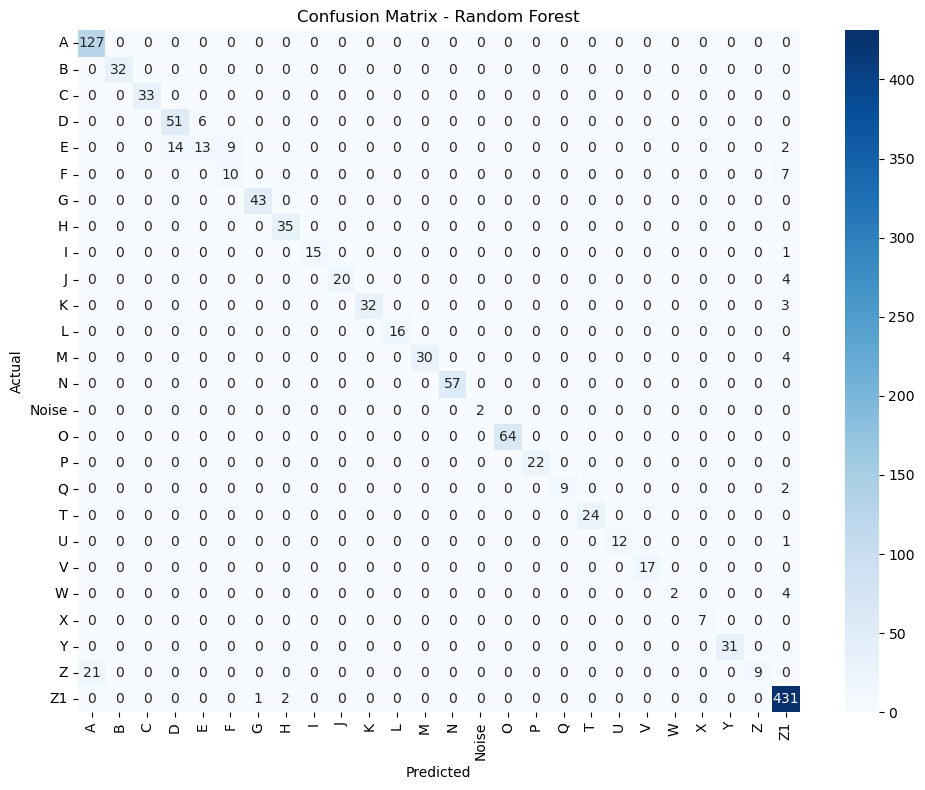

In [ ]:

best_params = {
    'n_estimators': 500,
    'max_depth': 30,
    'min_samples_split': 5,
    'min_samples_leaf': 2,
    'max_features': 'sqrt',
    'bootstrap': True,
    'random_state': 42,
    'n_jobs': -1,
    'class_weight': 'balanced'  
}

print("=== Training Final Random Forest Model with Best Parameters ===")
start_time = time.time()


rf_model = RandomForestClassifier(**best_params)


rf_model.fit(X_train_final, y_train_final)


rf_pred = rf_model.predict(X_test_final)


rf_accuracy = accuracy_score(y_test_final, rf_pred)
rf_f1 = f1_score(y_test_final, rf_pred, average='weighted')


skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
rf_cv_scores = cross_val_score(rf_model, X_train_final, y_train_final, cv=skf, scoring='accuracy')

rf_train_time = time.time() - start_time


print(f"✅ Accuracy: {rf_accuracy:.4f}")
print(f"✅ F1 Score (weighted): {rf_f1:.4f}")
print(f"✅ CV Accuracy Mean: {rf_cv_scores.mean():.4f} (+/- {rf_cv_scores.std():.4f})")
print(f"⏱️ Total Training Time: {rf_train_time:.2f} seconds")


present_labels = np.unique(y_test_final)


if np.issubdtype(present_labels.dtype, np.integer):
    target_names = le.classes_[present_labels]
else:

    target_names = present_labels

print("\n📊 Classification Report:")
print(classification_report(
    y_test_final,
    rf_pred,
    labels=present_labels,
    target_names=target_names
))


cm = confusion_matrix(y_test_final, rf_pred, labels=present_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Random Forest')
plt.tight_layout()
plt.show()


LogisticRegression

=== Training Logistic Regression with Fixed Parameters ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.




✅ Accuracy: 0.5469
✅ F1 Score (weighted): 0.5179
✅ CV Accuracy Mean: 0.4222 (+/- 0.0303)
⏱️ Total Training Time: 124.44 seconds

📄 Classification Report:
              precision    recall  f1-score   support

           A       0.72      0.82      0.77       127
           B       0.55      0.19      0.28        32
           C       0.46      0.39      0.43        33
           D       0.45      0.33      0.38        57
           E       0.23      0.29      0.26        38
           F       0.12      0.06      0.08        17
           G       0.60      0.70      0.65        43
           H       0.39      0.26      0.31        35
           I       0.14      0.12      0.13        16
           J       0.14      0.08      0.11        24
           K       0.50      0.29      0.36        35
           L       0.22      0.12      0.16        16
           M       0.28      0.21      0.24        34
           N       0.70      0.74      0.72        57
       Noise       0.00      0.00 

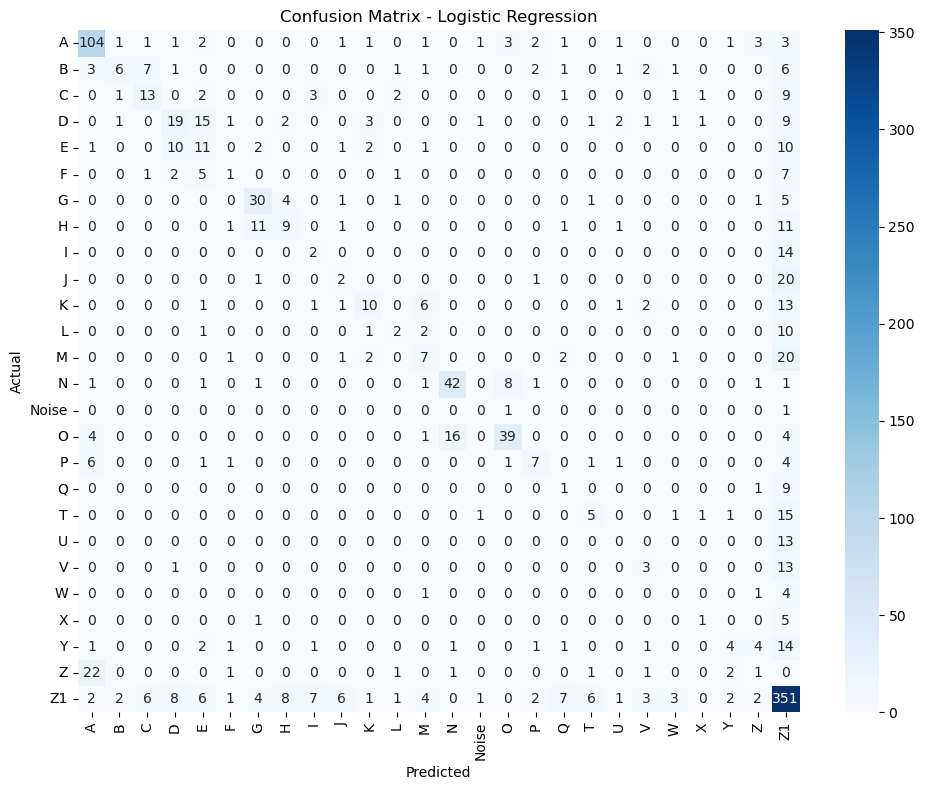

In [ ]:

print("=== Training Logistic Regression with Fixed Parameters ===")
start_time = time.time()

# إعداد النموذج
lr_model = LogisticRegression(
    C=1.0,
    solver='lbfgs',
    max_iter=1000,
    # multi_class='multinomial',
    random_state=42,
    n_jobs=-1
)

# تدريب النموذج
lr_model.fit(X_train_final, y_train_final)

# التنبؤ على مجموعة الاختبار
lr_pred = lr_model.predict(X_test_final)

# حساب المقاييس
lr_accuracy = accuracy_score(y_test_final, lr_pred)
lr_f1 = f1_score(y_test_final, lr_pred, average='weighted')
lr_cv_scores = cross_val_score(lr_model, X_train_final, y_train_final, cv=5, scoring='accuracy')

lr_train_time = time.time() - start_time

print(f"\n✅ Accuracy: {lr_accuracy:.4f}")
print(f"✅ F1 Score (weighted): {lr_f1:.4f}")
print(f"✅ CV Accuracy Mean: {lr_cv_scores.mean():.4f} (+/- {lr_cv_scores.std():.4f})")
print(f"⏱️ Total Training Time: {lr_train_time:.2f} seconds")

# استخراج الفئات الحقيقية الموجودة في y_test_final
present_labels = np.unique(y_test_final)

# تحديد أسماء الفئات المناسبة للـ classification_report والـ confusion_matrix
if np.issubdtype(present_labels.dtype, np.integer):
    target_names = le.classes_[present_labels]
else:
    target_names = present_labels

print("\n📄 Classification Report:")
print(classification_report(
    y_test_final,
    lr_pred,
    labels=present_labels,
    target_names=target_names
))

# مصفوفة الالتباس (Confusion Matrix)
cm = confusion_matrix(y_test_final, lr_pred, labels=present_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Logistic Regression')
plt.tight_layout()
plt.show()


=== Running GridSearchCV for KNN Hyperparameter Tuning ===


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning:

One or more of the test scores are non-finite: [       nan 0.44838596 0.38687468 0.38687468        nan 0.48089507
 0.40102399 0.41756426        nan 0.52283553 0.44510357 0.45421385
        nan 0.53825747 0.46784423 0.47343864        nan 0.54440092
 0.47208819 0.48306952        nan 0.55181499 0.47826395 0.48552627
        nan 0.54634204 0.48444815 0.49328087        nan 0.53851537
 0.48208978 0.49022192        nan 0.52812923 0.48403058 0.48951946
        nan 0.52486704 0.48655204 0.49254926        nan 0.51866429
 0.48739031 0.4951061         nan 0.51359429 0.48740084 0.49282504
        nan 0.50499138 0.47893594 0.48960326        nan 0.4999766
 0.48176632 0.49338574        nan 0.4889733  0.47994705 0.48611803
        n

⏱️ Tuning Time: 178.72 seconds
✅ Best params: {'n_neighbors': 11, 'p': 1, 'weights': 'distance'}
✅ Best CV F1 Score: 0.5518149902526212


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.




✅ Accuracy: 0.3527
✅ F1 Score (weighted): 0.3414
✅ CV Accuracy Mean: 0.5845 (+/- 0.0167)

📄 Classification Report:
              precision    recall  f1-score   support

           A       0.32      0.37      0.35       127
           B       0.35      0.22      0.27        32
           C       0.54      0.39      0.46        33
           D       0.23      0.21      0.22        57
           E       0.11      0.08      0.09        38
           F       0.00      0.00      0.00        17
           G       0.30      0.40      0.34        43
           H       0.21      0.17      0.19        35
           I       0.18      0.12      0.15        16
           J       0.42      0.33      0.37        24
           K       0.29      0.17      0.21        35
           L       0.00      0.00      0.00        16
           M       0.00      0.00      0.00        34
           N       0.33      0.42      0.37        57
       Noise       0.00      0.00      0.00         2
           O       

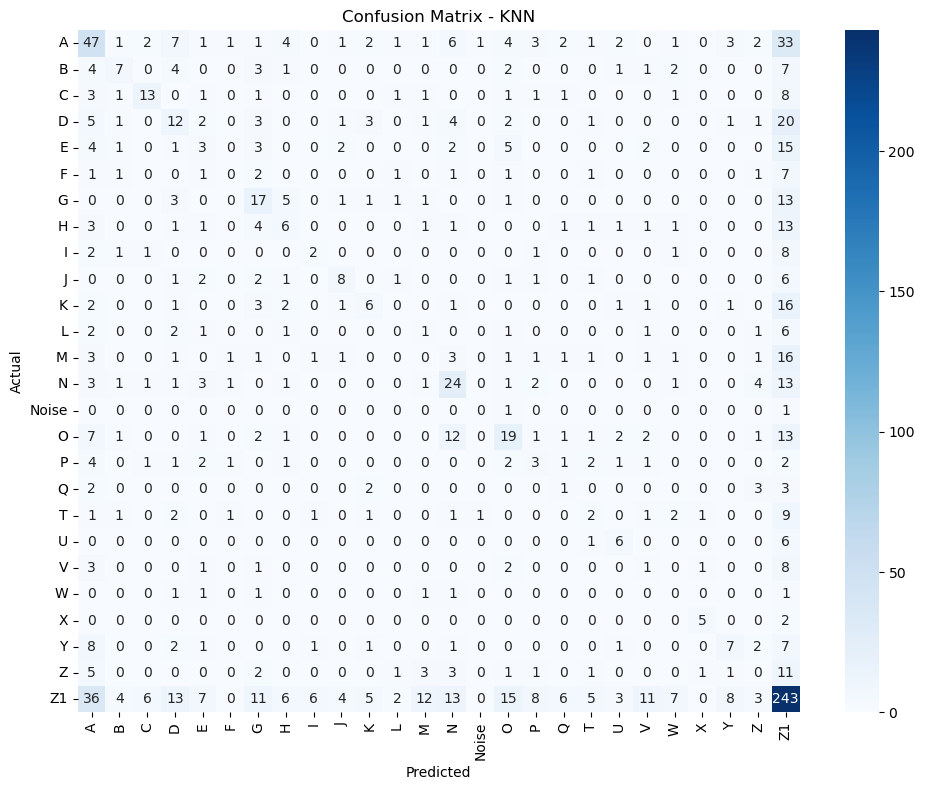

In [ ]:

# 1. Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_final)
X_test_scaled = scaler.transform(X_test_final)

# 2. GridSearch لتحديد أفضل المعاملات
param_grid = {
    'n_neighbors': range(1, 50, 2),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

print("=== Running GridSearchCV for KNN Hyperparameter Tuning ===")
knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)
start_time = time.time()
grid.fit(X_train_scaled, y_train_final)
print(f"⏱️ Tuning Time: {time.time() - start_time:.2f} seconds")

print("✅ Best params:", grid.best_params_)
print("✅ Best CV F1 Score:", grid.best_score_)

# 3. تدريب النموذج النهائي بأفضل المعاملات
best_params = grid.best_params_
knn_model = KNeighborsClassifier(**best_params)
knn_model.fit(X_train_scaled, y_train_final)

# 4. تقييم على مجموعة الاختبار
knn_pred = knn_model.predict(X_test_scaled)

knn_accuracy = accuracy_score(y_test_final, knn_pred)
knn_f1 = f1_score(y_test_final, knn_pred, average='weighted')
knn_cv_scores = cross_val_score(knn_model, X_train_scaled, y_train_final, cv=5, scoring='accuracy')

print(f"\n✅ Accuracy: {knn_accuracy:.4f}")
print(f"✅ F1 Score (weighted): {knn_f1:.4f}")
print(f"✅ CV Accuracy Mean: {knn_cv_scores.mean():.4f} (+/- {knn_cv_scores.std():.4f})")

# 5. عرض التقرير والمصفوفة
present_labels = np.unique(y_test_final)
if np.issubdtype(present_labels.dtype, np.integer):
    target_names = le.classes_[present_labels]
else:
    target_names = present_labels

print("\n📄 Classification Report:")
print(classification_report(y_test_final, knn_pred, labels=present_labels, target_names=target_names))

cm = confusion_matrix(y_test_final, knn_pred, labels=present_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - KNN')
plt.tight_layout()
plt.show()



=== Training Final XGBoost with Best Params (No Optuna) ===

✅ Train Accuracy: 0.9944
✅ Train F1 Score (weighted): 0.9936


c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


1 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ASUS\anaconda3\Lib\site-packages\xgboost\core.py", line 729, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^


✅ Test Accuracy: 0.9535
✅ Test F1 Score (weighted): 0.9499
✅ CV Accuracy Mean: nan (+/- nan)
✅ Total Training Time: 127.77 seconds

📄 Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       127
           1       1.00      1.00      1.00        32
           2       1.00      1.00      1.00        33
           3       0.71      0.79      0.75        57
           4       0.43      0.26      0.33        38
           5       0.62      0.94      0.74        17
           6       1.00      1.00      1.00        43
           7       1.00      1.00      1.00        35
           8       1.00      1.00      1.00        16
           9       1.00      1.00      1.00        24
          10       1.00      1.00      1.00        35
          11       1.00      1.00      1.00        16
          12       1.00      1.00      1.00        34
          13       1.00      1.00      1.00        57
          14       0.00      0.

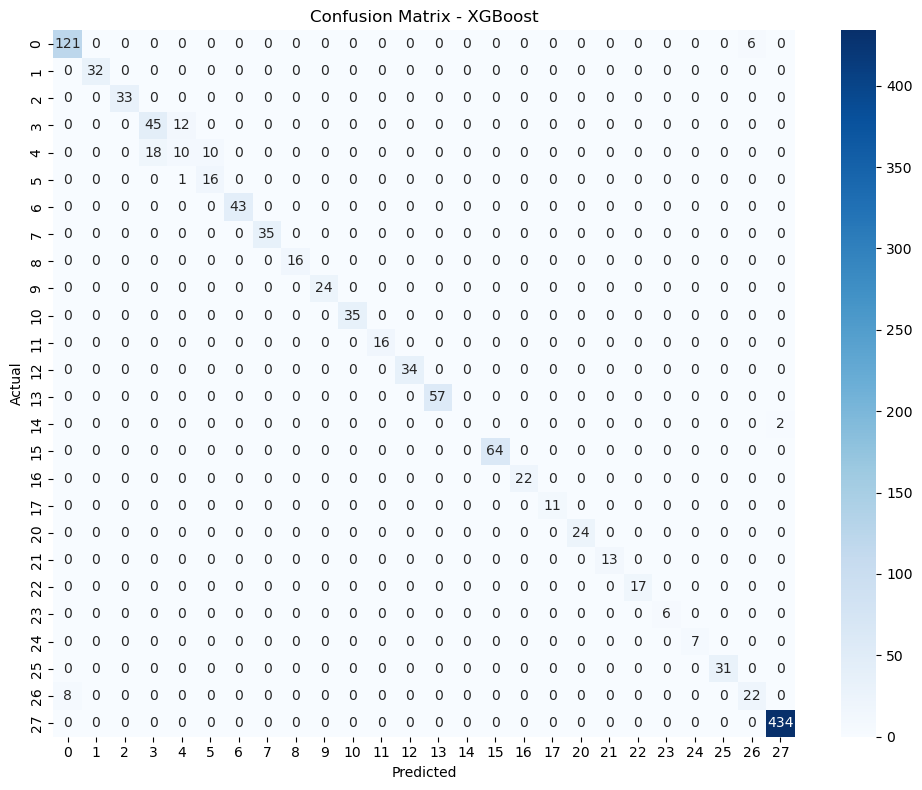

In [ ]:
# ترميز الأصناف
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# أفضل المعاملات التي حصلت عليها من Optuna
best_params = {
    'n_estimators': 50,
    'max_depth': 4,
    'learning_rate': 0.24412594992746706,
    'subsample': 0.983715971923927,
    'colsample_bytree': 0.9868267221113931,
    'gamma': 0.666490943227223,
    'reg_alpha': 1.9018530608935051,
    'reg_lambda': 2.8599375841754995,
    'random_state': 42,
    'objective': 'multi:softmax',
    'num_class': num_classes,
    'verbosity': 0
}

print("\n=== Training Final XGBoost with Best Params (No Optuna) ===")
start_time = time.time()

xgb_model = xgb.XGBClassifier(**best_params)
xgb_model.fit(X_train_final, y_train_enc)

# تقييم على مجموعة التدريب
xgb_train_pred_enc = xgb_model.predict(X_train_final)
xgb_train_accuracy = accuracy_score(y_train_enc, xgb_train_pred_enc)
xgb_train_f1 = f1_score(y_train_enc, xgb_train_pred_enc, average='weighted')

print(f"\n✅ Train Accuracy: {xgb_train_accuracy:.4f}")
print(f"✅ Train F1 Score (weighted): {xgb_train_f1:.4f}")

# تقييم على مجموعة الاختبار
xgb_pred_enc = xgb_model.predict(X_test_final)

xgb_accuracy = accuracy_score(y_test_enc, xgb_pred_enc)
xgb_f1 = f1_score(y_test_enc, xgb_pred_enc, average='weighted')
xgb_cv_scores = cross_val_score(xgb_model, X_train_final, y_train_enc, cv=5, scoring='accuracy')
xgb_train_time = time.time() - start_time

# فك التشفير للتقرير النهائي
xgb_pred = le.inverse_transform(xgb_pred_enc)

print(f"\n✅ Test Accuracy: {xgb_accuracy:.4f}")
print(f"✅ Test F1 Score (weighted): {xgb_f1:.4f}")
print(f"✅ CV Accuracy Mean: {xgb_cv_scores.mean():.4f} (+/- {xgb_cv_scores.std():.4f})")
print(f"✅ Total Training Time: {xgb_train_time:.2f} seconds")

# استخراج الفئات الموجودة في بيانات الاختبار
present_labels = np.unique(y_test_final)
target_names = present_labels.astype(str)

print("\n📄 Classification Report:")
print(classification_report(y_test_final, xgb_pred, labels=present_labels, target_names=target_names))

# مصفوفة الالتباس
cm = confusion_matrix(y_test_final, xgb_pred, labels=present_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - XGBoost')
plt.tight_layout()
plt.show()



🚀 Training XGBoost Model with EarlyStopping...
[0]	train-mlogloss:1.49170	valid-mlogloss:1.53295
[1]	train-mlogloss:1.09815	valid-mlogloss:1.12631
[2]	train-mlogloss:0.87604	valid-mlogloss:0.90487
[3]	train-mlogloss:0.72570	valid-mlogloss:0.75440
[4]	train-mlogloss:0.60928	valid-mlogloss:0.63796
[5]	train-mlogloss:0.52004	valid-mlogloss:0.54884
[6]	train-mlogloss:0.44709	valid-mlogloss:0.47687
[7]	train-mlogloss:0.38935	valid-mlogloss:0.42033
[8]	train-mlogloss:0.34258	valid-mlogloss:0.37542
[9]	train-mlogloss:0.30342	valid-mlogloss:0.33739
[10]	train-mlogloss:0.27139	valid-mlogloss:0.30687
[11]	train-mlogloss:0.24458	valid-mlogloss:0.28229
[12]	train-mlogloss:0.22252	valid-mlogloss:0.26091
[13]	train-mlogloss:0.20384	valid-mlogloss:0.24372
[14]	train-mlogloss:0.18750	valid-mlogloss:0.22938
[15]	train-mlogloss:0.17350	valid-mlogloss:0.21792
[16]	train-mlogloss:0.16149	valid-mlogloss:0.20693
[17]	train-mlogloss:0.15049	valid-mlogloss:0.19747
[18]	train-mlogloss:0.14192	valid-mlogloss:0

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



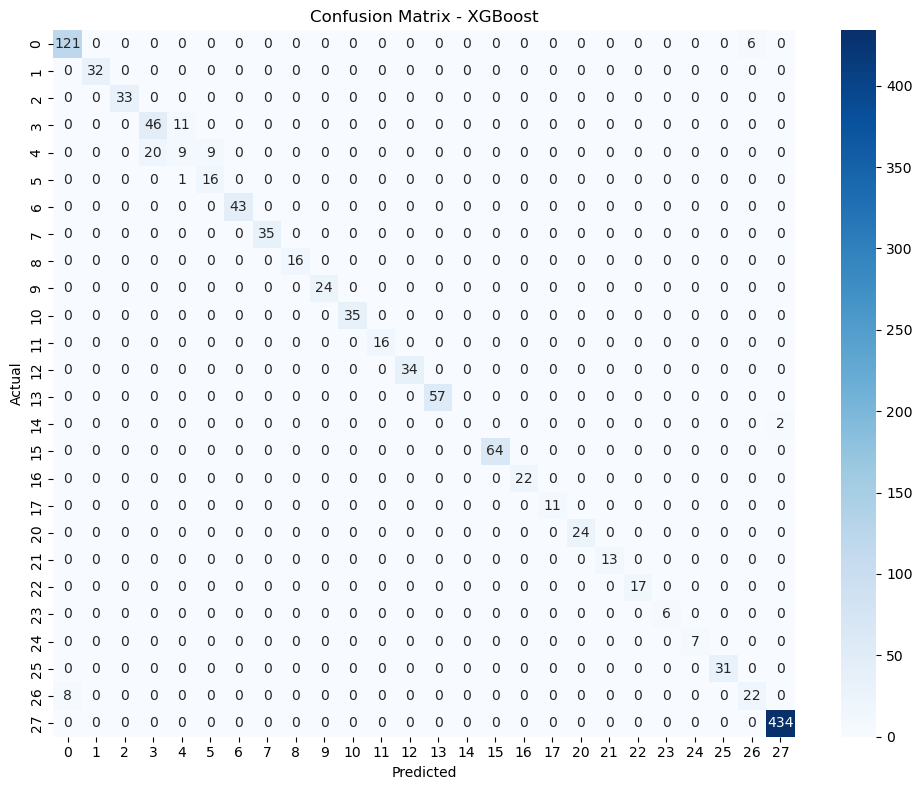

In [ ]:
# ترميز الأصناف
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# تحويل البيانات إلى DMatrix (واجهة XGBoost الأصلية)
dtrain = xgb.DMatrix(X_train_final, label=y_train_enc)
dvalid = xgb.DMatrix(X_test_final, label=y_test_enc)

# إعداد المعاملات بما في ذلك L1 و L2 والتوقف المبكر
params = {
    'max_depth': 4,
    'learning_rate': 0.244,
    'subsample': 0.9837,
    'colsample_bytree': 0.9868,
    'gamma': 0.666,
    'reg_alpha': 2,  # L1 regularization
    'reg_lambda': 3,  # L2 regularization
    'objective': 'multi:softmax',
    'num_class': num_classes,
    'eval_metric': 'mlogloss',
    'verbosity': 0,
    'seed': 42
}

evals = [(dtrain, 'train'), (dvalid, 'valid')]

print("\n🚀 Training XGBoost Model with EarlyStopping...")

start_time = time.time()

# تدريب النموذج مع EarlyStopping
bst = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=200,
    evals=evals,
    callbacks=[EarlyStopping(rounds=20, save_best=True)]
)

train_time = time.time() - start_time

# التنبؤ على بيانات التدريب
y_train_pred_enc = bst.predict(dtrain)
train_acc = accuracy_score(y_train_enc, y_train_pred_enc)
train_f1 = f1_score(y_train_enc, y_train_pred_enc, average='weighted')

print(f"\n✅ Train Accuracy: {train_acc:.4f}")
print(f"✅ Train F1 Score: {train_f1:.4f}")

# التنبؤ على بيانات الاختبار
y_test_pred_enc = bst.predict(dvalid)
test_acc = accuracy_score(y_test_enc, y_test_pred_enc)
test_f1 = f1_score(y_test_enc, y_test_pred_enc, average='weighted')

# فك ترميز التوقعات لتقرير التصنيف
y_test_pred = le.inverse_transform(y_test_pred_enc.astype(int))

print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"✅ Test F1 Score: {test_f1:.4f}")
print(f"⏱️ Training Time: {train_time:.2f} seconds")

# التقرير التفصيلي
print("\n📄 Classification Report:")
print(classification_report(y_test_final, y_test_pred))

# مصفوفة الالتباس
cm = confusion_matrix(y_test_final, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test_final).astype(str),
            yticklabels=np.unique(y_test_final).astype(str))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - XGBoost')
plt.tight_layout()
plt.show()



🚀 Training LightGBM Model with EarlyStopping...
Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[32]	train's multi_logloss: 0.0431148	valid's multi_logloss: 0.112866

✅ Train Accuracy: 0.9988
✅ Train F1 Score: 0.9983

✅ Test Accuracy: 0.9576
✅ Test F1 Score: 0.9553
⏱️ Training Time: 5.95 seconds

📄 Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00       127
           B       1.00      1.00      1.00        32
           C       1.00      1.00      1.00        33
           D       1.00      1.00      1.00        57
           E       1.00      1.00      1.00        38
           F       1.00      1.00      1.00        17
           G       1.00      1.00      1.00        43
           H       1.00      1.00      1.00        35
           I       1.00      1.00      1.00        16
           J       1.00      1.00      1.00        24
           K       1.00      1.00

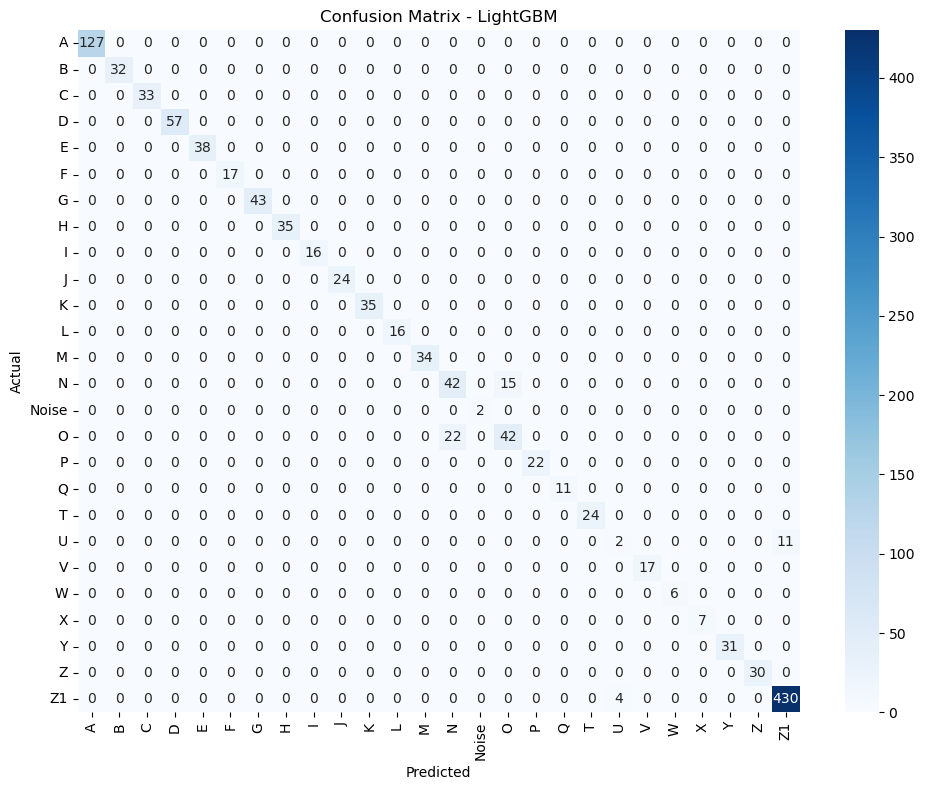

In [ ]:

# ترميز الأصناف
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# تحويل البيانات إلى LightGBM Dataset
train_data = lgb.Dataset(X_train_final, label=y_train_enc)
valid_data = lgb.Dataset(X_test_final, label=y_test_enc, reference=train_data)

# إعداد المعاملات
params = {
    'objective': 'multiclass',
    'num_class': num_classes,
    'metric': 'multi_logloss',
    'learning_rate': 0.244,
    'max_depth': 4,
    'subsample': 0.9837,
    'colsample_bytree': 0.9868,
    'lambda_l1': 2,  # L1 regularization
    'lambda_l2': 3,  # L2 regularization
    'verbose': -1,
    'seed': 42
}

print("\n🚀 Training LightGBM Model with EarlyStopping...")
start_time = time.time()

bst = lgb.train(
    params,
    train_data,
    num_boost_round=200,
    valid_sets=[train_data, valid_data],
    valid_names=['train', 'valid'],
    callbacks=[
        lgb.early_stopping(stopping_rounds=20),
        lgb.log_evaluation(0)  # disable eval logging
    ]
)



train_time = time.time() - start_time

# التنبؤ على بيانات التدريب
y_train_pred_enc = np.argmax(bst.predict(X_train_final, num_iteration=bst.best_iteration), axis=1)
train_acc = accuracy_score(y_train_enc, y_train_pred_enc)
train_f1 = f1_score(y_train_enc, y_train_pred_enc, average='weighted')

print(f"\n✅ Train Accuracy: {train_acc:.4f}")
print(f"✅ Train F1 Score: {train_f1:.4f}")

# التنبؤ على بيانات الاختبار
y_test_pred_enc = np.argmax(bst.predict(X_test_final, num_iteration=bst.best_iteration), axis=1)
test_acc = accuracy_score(y_test_enc, y_test_pred_enc)
test_f1 = f1_score(y_test_enc, y_test_pred_enc, average='weighted')

# فك ترميز التوقعات لتقرير التصنيف
y_test_pred = le.inverse_transform(y_test_pred_enc)

print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"✅ Test F1 Score: {test_f1:.4f}")
print(f"⏱️ Training Time: {train_time:.2f} seconds")

# التقرير التفصيلي
print("\n📄 Classification Report:")
print(classification_report(y_test_final, y_test_pred))

# مصفوفة الالتباس
cm = confusion_matrix(y_test_final, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test_final).astype(str),
            yticklabels=np.unique(y_test_final).astype(str))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - LightGBM')
plt.tight_layout()
plt.show()


[I 2025-07-13 06:02:45,629] A new study created in memory with name: no-name-ac43f728-efa0-4e8a-ac42-257d33b641e7



🎯 Running Optuna Optimization...
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:02:54,427] Trial 0 finished with value: 0.9552848361154299 and parameters: {'learning_rate': 0.1713010719928306, 'max_depth': 3, 'subsample': 0.7799026381039207, 'colsample_bytree': 0.7618756230894635, 'lambda_l1': 3.0283894785170418, 'lambda_l2': 3.126263412505374}. Best is trial 0 with value: 0.9552848361154299.


Early stopping, best iteration is:
[62]	valid's multi_logloss: 0.122341
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:05,720] Trial 1 finished with value: 0.9563918588384981 and parameters: {'learning_rate': 0.19591900891615985, 'max_depth': 5, 'subsample': 0.8099771590288847, 'colsample_bytree': 0.9156876539927252, 'lambda_l1': 0.15418494052451548, 'lambda_l2': 3.4956924266013063}. Best is trial 1 with value: 0.9563918588384981.


Early stopping, best iteration is:
[45]	valid's multi_logloss: 0.102085
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:14,506] Trial 2 finished with value: 0.9555237515458809 and parameters: {'learning_rate': 0.23814433850167804, 'max_depth': 9, 'subsample': 0.8422847059411179, 'colsample_bytree': 0.8245187093768374, 'lambda_l1': 0.019741461825288353, 'lambda_l2': 1.830400937750477}. Best is trial 1 with value: 0.9563918588384981.


Early stopping, best iteration is:
[23]	valid's multi_logloss: 0.1085
Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[125]	valid's multi_logloss: 0.14734


[I 2025-07-13 06:03:27,394] Trial 3 finished with value: 0.9528891117684928 and parameters: {'learning_rate': 0.04980203903419706, 'max_depth': 8, 'subsample': 0.8446520048859772, 'colsample_bytree': 0.7363844484697754, 'lambda_l1': 4.403003221580968, 'lambda_l2': 1.8433286686777133}. Best is trial 1 with value: 0.9563918588384981.


Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:36,724] Trial 4 finished with value: 0.9580265196714725 and parameters: {'learning_rate': 0.13116489948933768, 'max_depth': 7, 'subsample': 0.7795922066141371, 'colsample_bytree': 0.8734148742123578, 'lambda_l1': 0.8599244678183321, 'lambda_l2': 2.7884486677884395}. Best is trial 4 with value: 0.9580265196714725.


Early stopping, best iteration is:
[55]	valid's multi_logloss: 0.101982
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:47,791] Trial 5 finished with value: 0.9577969136341639 and parameters: {'learning_rate': 0.05788740661147969, 'max_depth': 8, 'subsample': 0.8875996912080407, 'colsample_bytree': 0.9172410545521882, 'lambda_l1': 2.190111636130367, 'lambda_l2': 0.03617781638570794}. Best is trial 4 with value: 0.9580265196714725.


Early stopping, best iteration is:
[84]	valid's multi_logloss: 0.114335
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:54,039] Trial 6 finished with value: 0.9579756971911355 and parameters: {'learning_rate': 0.18154028569240868, 'max_depth': 3, 'subsample': 0.7405708006746289, 'colsample_bytree': 0.8928191552100314, 'lambda_l1': 2.056607803142621, 'lambda_l2': 1.315097944362134}. Best is trial 4 with value: 0.9580265196714725.


Early stopping, best iteration is:
[33]	valid's multi_logloss: 0.104539
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:03:59,390] Trial 7 finished with value: 0.9625885073963653 and parameters: {'learning_rate': 0.21114973845732665, 'max_depth': 5, 'subsample': 0.893851815794293, 'colsample_bytree': 0.7886126482714202, 'lambda_l1': 2.715476677132733, 'lambda_l2': 3.3323310378981215}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[33]	valid's multi_logloss: 0.128399
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:07,467] Trial 8 finished with value: 0.959550636823659 and parameters: {'learning_rate': 0.09863957707285181, 'max_depth': 6, 'subsample': 0.9768535534945075, 'colsample_bytree': 0.7959346763890068, 'lambda_l1': 2.762617053532117, 'lambda_l2': 1.4052073798153901}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[67]	valid's multi_logloss: 0.120405
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:13,337] Trial 9 finished with value: 0.9533977845547182 and parameters: {'learning_rate': 0.1445668340254887, 'max_depth': 7, 'subsample': 0.9896182629584223, 'colsample_bytree': 0.765840794723843, 'lambda_l1': 2.4090709243832857, 'lambda_l2': 1.7579753483739995}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[39]	valid's multi_logloss: 0.125879
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:18,620] Trial 10 finished with value: 0.956432012368907 and parameters: {'learning_rate': 0.29822095170689134, 'max_depth': 5, 'subsample': 0.9169310103558882, 'colsample_bytree': 0.9943064091587952, 'lambda_l1': 4.232804580764623, 'lambda_l2': 4.572175406793114}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[39]	valid's multi_logloss: 0.136801
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:28,250] Trial 11 finished with value: 0.9580452608981213 and parameters: {'learning_rate': 0.09183068047414822, 'max_depth': 5, 'subsample': 0.9723463917279919, 'colsample_bytree': 0.8075281476009423, 'lambda_l1': 3.3651925172092656, 'lambda_l2': 4.2901907258390555}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[88]	valid's multi_logloss: 0.133353
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:32,657] Trial 12 finished with value: 0.9524853091976504 and parameters: {'learning_rate': 0.23691760579996674, 'max_depth': 6, 'subsample': 0.9317578777249333, 'colsample_bytree': 0.7114168385425701, 'lambda_l1': 1.4861178176312941, 'lambda_l2': 0.6172087561483885}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[26]	valid's multi_logloss: 0.143875
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:04:41,254] Trial 13 finished with value: 0.9566359224521962 and parameters: {'learning_rate': 0.09904654514902655, 'max_depth': 4, 'subsample': 0.9439043146412939, 'colsample_bytree': 0.800768332439244, 'lambda_l1': 3.5729694123236193, 'lambda_l2': 3.7948535203423823}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[81]	valid's multi_logloss: 0.132443
Training until validation scores don't improve for 20 rounds
Did not meet early stopping. Best iteration is:
[200]	valid's multi_logloss: 0.190492


[I 2025-07-13 06:05:05,630] Trial 14 finished with value: 0.9588326515498898 and parameters: {'learning_rate': 0.011141804539508748, 'max_depth': 10, 'subsample': 0.8879820542924243, 'colsample_bytree': 0.8398605848628247, 'lambda_l1': 2.9170775715305726, 'lambda_l2': 2.2825308203479526}. Best is trial 7 with value: 0.9625885073963653.


Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:10,242] Trial 15 finished with value: 0.9527175881059381 and parameters: {'learning_rate': 0.23745496098965949, 'max_depth': 6, 'subsample': 0.997261353935602, 'colsample_bytree': 0.7786147710524602, 'lambda_l1': 1.565669368947062, 'lambda_l2': 0.9554797998663318}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[31]	valid's multi_logloss: 0.129354
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:16,361] Trial 16 finished with value: 0.9584490772204043 and parameters: {'learning_rate': 0.1205331416993475, 'max_depth': 4, 'subsample': 0.8857322792219288, 'colsample_bytree': 0.7166100444916522, 'lambda_l1': 4.946708052356948, 'lambda_l2': 2.523507213594896}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[60]	valid's multi_logloss: 0.150557
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:20,631] Trial 17 finished with value: 0.9552033275123173 and parameters: {'learning_rate': 0.2986150665724405, 'max_depth': 6, 'subsample': 0.9576971291184874, 'colsample_bytree': 0.8592043110664513, 'lambda_l1': 3.7514674771327075, 'lambda_l2': 3.9514801774070896}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[27]	valid's multi_logloss: 0.139445
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:27,206] Trial 18 finished with value: 0.9551976099653008 and parameters: {'learning_rate': 0.22096943623063242, 'max_depth': 4, 'subsample': 0.9002109515829982, 'colsample_bytree': 0.9584449530499165, 'lambda_l1': 2.780320473544536, 'lambda_l2': 3.1628634231706974}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[47]	valid's multi_logloss: 0.118503
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:34,009] Trial 19 finished with value: 0.9545875269828111 and parameters: {'learning_rate': 0.2043183609049684, 'max_depth': 8, 'subsample': 0.8568921910290958, 'colsample_bytree': 0.79419333977868, 'lambda_l1': 1.639643872364015, 'lambda_l2': 4.962606822621773}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[49]	valid's multi_logloss: 0.11475
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:05:38,025] Trial 20 finished with value: 0.938999200438009 and parameters: {'learning_rate': 0.27580275503777835, 'max_depth': 7, 'subsample': 0.7210882021502909, 'colsample_bytree': 0.7456924541150416, 'lambda_l1': 4.063543831696268, 'lambda_l2': 0.5040211261717902}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[35]	valid's multi_logloss: 0.195063
Training until validation scores don't improve for 20 rounds
Did not meet early stopping. Best iteration is:
[200]	valid's multi_logloss: 0.169378


[I 2025-07-13 06:06:00,997] Trial 21 finished with value: 0.9571740226852404 and parameters: {'learning_rate': 0.01313969258052701, 'max_depth': 9, 'subsample': 0.8781842072930623, 'colsample_bytree': 0.8234257080972571, 'lambda_l1': 3.053675361916155, 'lambda_l2': 2.2317469377556183}. Best is trial 7 with value: 0.9625885073963653.


Training until validation scores don't improve for 20 rounds
Did not meet early stopping. Best iteration is:
[200]	valid's multi_logloss: 0.126047


[I 2025-07-13 06:06:23,751] Trial 22 finished with value: 0.9538335293094355 and parameters: {'learning_rate': 0.018846821993297663, 'max_depth': 10, 'subsample': 0.9205410059911158, 'colsample_bytree': 0.836584884596347, 'lambda_l1': 2.6589785844546054, 'lambda_l2': 1.3491568886792404}. Best is trial 7 with value: 0.9625885073963653.


Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:06:34,437] Trial 23 finished with value: 0.9542112450098014 and parameters: {'learning_rate': 0.0693988648319449, 'max_depth': 10, 'subsample': 0.8178542784066924, 'colsample_bytree': 0.8593323171176672, 'lambda_l1': 3.2829140724705486, 'lambda_l2': 2.2533124587838795}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[87]	valid's multi_logloss: 0.134244
Training until validation scores don't improve for 20 rounds
Did not meet early stopping. Best iteration is:
[200]	valid's multi_logloss: 0.117523


[I 2025-07-13 06:06:55,086] Trial 24 finished with value: 0.9562676935869516 and parameters: {'learning_rate': 0.03283053750793809, 'max_depth': 5, 'subsample': 0.9707318609287101, 'colsample_bytree': 0.7848431326730348, 'lambda_l1': 2.210340869267813, 'lambda_l2': 2.8302638073148927}. Best is trial 7 with value: 0.9625885073963653.


Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:07:03,517] Trial 25 finished with value: 0.961960870706446 and parameters: {'learning_rate': 0.09272144922927286, 'max_depth': 6, 'subsample': 0.8648867462632138, 'colsample_bytree': 0.8196226390297999, 'lambda_l1': 2.765256055955809, 'lambda_l2': 1.3341566039776065}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[64]	valid's multi_logloss: 0.11964
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:07:11,964] Trial 26 finished with value: 0.9588210759022647 and parameters: {'learning_rate': 0.10438335236217922, 'max_depth': 6, 'subsample': 0.8172005816986206, 'colsample_bytree': 0.8142495834734854, 'lambda_l1': 1.8746582432729144, 'lambda_l2': 1.2258178266791928}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[62]	valid's multi_logloss: 0.110256
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:07:17,666] Trial 27 finished with value: 0.9589984658683887 and parameters: {'learning_rate': 0.15577952697011632, 'max_depth': 5, 'subsample': 0.8667465246640874, 'colsample_bytree': 0.7434901283446753, 'lambda_l1': 1.1284763429305982, 'lambda_l2': 0.8546023667351446}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[37]	valid's multi_logloss: 0.109549
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:07:26,492] Trial 28 finished with value: 0.9538363414842018 and parameters: {'learning_rate': 0.08421632627293822, 'max_depth': 7, 'subsample': 0.9105511223099152, 'colsample_bytree': 0.765679080633194, 'lambda_l1': 2.4768015350755186, 'lambda_l2': 1.7208336289717407}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[75]	valid's multi_logloss: 0.121842
Training until validation scores don't improve for 20 rounds


[I 2025-07-13 06:07:32,635] Trial 29 finished with value: 0.9541401042494919 and parameters: {'learning_rate': 0.16941273389352463, 'max_depth': 3, 'subsample': 0.7668955910201555, 'colsample_bytree': 0.891001249976974, 'lambda_l1': 3.829646484378222, 'lambda_l2': 3.324201004120848}. Best is trial 7 with value: 0.9625885073963653.


Early stopping, best iteration is:
[51]	valid's multi_logloss: 0.130837

🏆 Best Trial:
FrozenTrial(number=7, state=1, values=[0.9625885073963653], datetime_start=datetime.datetime(2025, 7, 13, 6, 3, 54, 40379), datetime_complete=datetime.datetime(2025, 7, 13, 6, 3, 59, 390364), params={'learning_rate': 0.21114973845732665, 'max_depth': 5, 'subsample': 0.893851815794293, 'colsample_bytree': 0.7886126482714202, 'lambda_l1': 2.715476677132733, 'lambda_l2': 3.3323310378981215}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.3, log=False, low=0.01, step=None), 'max_depth': IntDistribution(high=10, log=False, low=3, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.7, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=False, low=0.7, step=None), 'lambda_l1': FloatDistribution(high=5.0, log=False, low=0.0, step=None), 'lambda_l2': FloatDistribution(high=5.0, log=False, low=0.0, step=None)}, trial_i

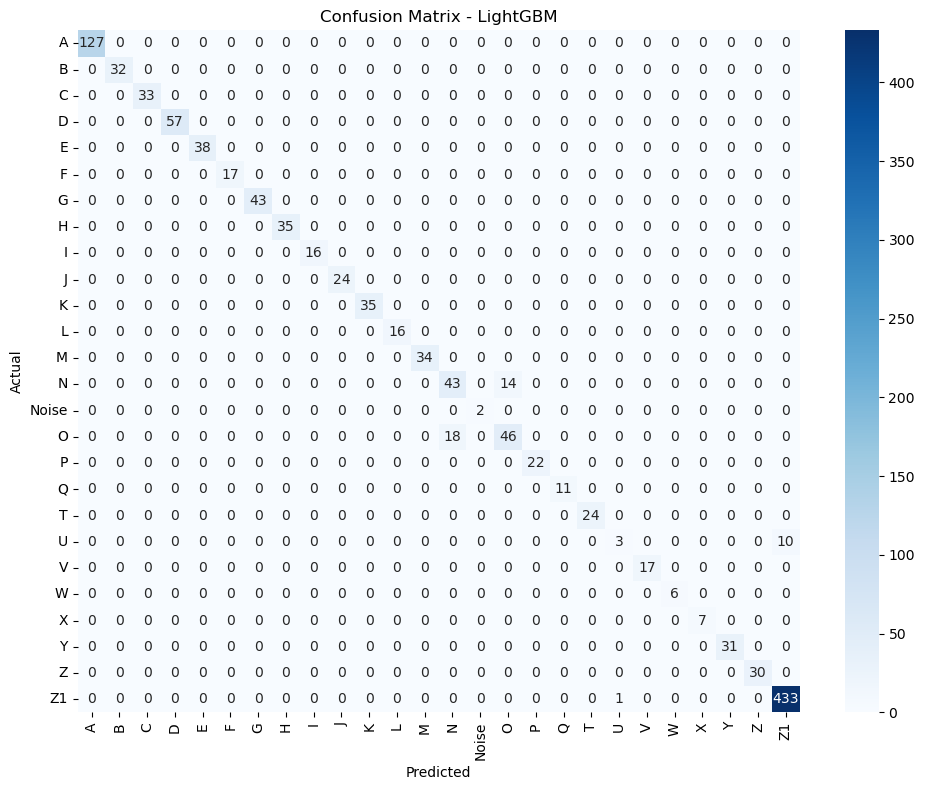

In [ ]:

# ترميز الأصناف
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# تحويل البيانات إلى LightGBM Dataset
def get_datasets():
    train_data = lgb.Dataset(X_train_final, label=y_train_enc)
    valid_data = lgb.Dataset(X_test_final, label=y_test_enc, reference=train_data)
    return train_data, valid_data

# دالة الهدف لاوبتونا
def objective(trial):
    param = {
        'objective': 'multiclass',
        'num_class': num_classes,
        'metric': 'multi_logloss',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'lambda_l1': trial.suggest_float('lambda_l1', 0.0, 5.0),
        'lambda_l2': trial.suggest_float('lambda_l2', 0.0, 5.0),
        'verbose': -1,
        'seed': 42
    }

    dtrain, dvalid = get_datasets()

    model = lgb.train(
        param,
        dtrain,
        num_boost_round=200,
        valid_sets=[dvalid],
        valid_names=['valid'],
        callbacks=[
            lgb.early_stopping(stopping_rounds=20),
            lgb.log_evaluation(0)
        ]
    )

    preds = model.predict(X_test_final, num_iteration=model.best_iteration)
    preds_enc = np.argmax(preds, axis=1)
    return f1_score(y_test_enc, preds_enc, average='weighted')

# تنفيذ التجربة
print("\n🎯 Running Optuna Optimization...")
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

print("\n🏆 Best Trial:")
print(study.best_trial)

# استخدام أفضل معلمات
best_params = study.best_trial.params
best_params.update({
    'objective': 'multiclass',
    'num_class': num_classes,
    'metric': 'multi_logloss',
    'verbose': -1,
    'seed': 42
})

print("\n🚀 Training LightGBM Model with Best Optuna Params...")
start_time = time.time()

train_data = lgb.Dataset(X_train_final, label=y_train_enc)
valid_data = lgb.Dataset(X_test_final, label=y_test_enc, reference=train_data)

bst = lgb.train(
    best_params,
    train_data,
    num_boost_round=200,
    valid_sets=[train_data, valid_data],
    valid_names=['train', 'valid'],
    callbacks=[
        lgb.early_stopping(stopping_rounds=20),
        lgb.log_evaluation(0)
    ]
)

train_time = time.time() - start_time

# التنبؤ على بيانات التدريب
y_train_pred_enc = np.argmax(bst.predict(X_train_final, num_iteration=bst.best_iteration), axis=1)
train_acc = accuracy_score(y_train_enc, y_train_pred_enc)
train_f1 = f1_score(y_train_enc, y_train_pred_enc, average='weighted')

print(f"\n✅ Train Accuracy: {train_acc:.4f}")
print(f"✅ Train F1 Score: {train_f1:.4f}")

# التنبؤ على بيانات الاختبار
y_test_pred_enc = np.argmax(bst.predict(X_test_final, num_iteration=bst.best_iteration), axis=1)
test_acc = accuracy_score(y_test_enc, y_test_pred_enc)
test_f1 = f1_score(y_test_enc, y_test_pred_enc, average='weighted')

# فك ترميز التوقعات لتقرير التصنيف
y_test_pred = le.inverse_transform(y_test_pred_enc)

print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"✅ Test F1 Score: {test_f1:.4f}")
print(f"⏱️ Training Time: {train_time:.2f} seconds")

# التقرير التفصيلي
print("\n📄 Classification Report:")
print(classification_report(y_test_final, y_test_pred))

# مصفوفة الالتباس
cm = confusion_matrix(y_test_final, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test_final).astype(str),
            yticklabels=np.unique(y_test_final).astype(str))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - LightGBM')
plt.tight_layout()
plt.show()



🚀 Training LightGBM Model with Best Parameters...
Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[33]	train's multi_logloss: 0.0568818	valid's multi_logloss: 0.128399

✅ Train Accuracy: 0.9990
✅ Train F1 Score: 0.9985

✅ Test Accuracy: 0.9649
✅ Test F1 Score: 0.9626
⏱️ Training Time: 6.28 seconds

📄 Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00       127
           B       1.00      1.00      1.00        32
           C       1.00      1.00      1.00        33
           D       1.00      1.00      1.00        57
           E       1.00      1.00      1.00        38
           F       1.00      1.00      1.00        17
           G       1.00      1.00      1.00        43
           H       1.00      1.00      1.00        35
           I       1.00      1.00      1.00        16
           J       1.00      1.00      1.00        24
           K       1.00      1.

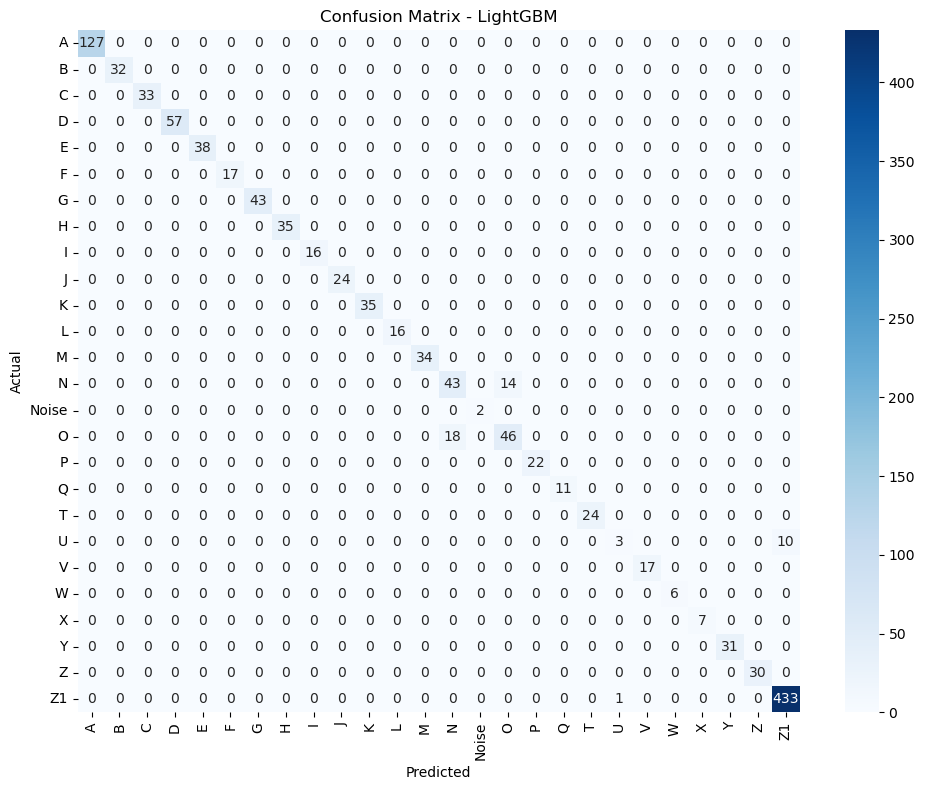

In [ ]:

# ترميز الأصناف
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_final)
y_test_enc = le.transform(y_test_final)
num_classes = len(le.classes_)

# تحويل البيانات إلى LightGBM Dataset
train_data = lgb.Dataset(X_train_final, label=y_train_enc)
valid_data = lgb.Dataset(X_test_final, label=y_test_enc, reference=train_data)

# إعداد المعاملات بناءً على أفضل تجربة من Optuna
params = {
    'objective': 'multiclass',
    'num_class': num_classes,
    'metric': 'multi_logloss',
    'learning_rate': 0.21114973845732665,
    'max_depth': 5,
    'subsample': 0.893851815794293,
    'colsample_bytree': 0.7886126482714202,
    'lambda_l1': 2.715476677132733,
    'lambda_l2': 3.3323310378981215,
    'verbose': -1,
    'seed': 42
}

print("\n🚀 Training LightGBM Model with Best Parameters...")
start_time = time.time()

bst = lgb.train(
    params,
    train_data,
    num_boost_round=200,
    valid_sets=[train_data, valid_data],
    valid_names=['train', 'valid'],
    callbacks=[
        lgb.early_stopping(stopping_rounds=20),
        lgb.log_evaluation(0)
    ]
)

train_time = time.time() - start_time

# التنبؤ على بيانات التدريب
y_train_pred_enc = np.argmax(bst.predict(X_train_final, num_iteration=bst.best_iteration), axis=1)
train_acc = accuracy_score(y_train_enc, y_train_pred_enc)
train_f1 = f1_score(y_train_enc, y_train_pred_enc, average='weighted')

print(f"\n✅ Train Accuracy: {train_acc:.4f}")
print(f"✅ Train F1 Score: {train_f1:.4f}")

# التنبؤ على بيانات الاختبار
y_test_pred_enc = np.argmax(bst.predict(X_test_final, num_iteration=bst.best_iteration), axis=1)
test_acc = accuracy_score(y_test_enc, y_test_pred_enc)
test_f1 = f1_score(y_test_enc, y_test_pred_enc, average='weighted')

# فك ترميز التوقعات لتقرير التصنيف
y_test_pred = le.inverse_transform(y_test_pred_enc)

print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"✅ Test F1 Score: {test_f1:.4f}")
print(f"⏱️ Training Time: {train_time:.2f} seconds")

# التقرير التفصيلي
print("\n📄 Classification Report:")
print(classification_report(y_test_final, y_test_pred))

# مصفوفة الالتباس
cm = confusion_matrix(y_test_final, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test_final).astype(str),
            yticklabels=np.unique(y_test_final).astype(str))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - LightGBM')
plt.tight_layout()
plt.show()
